In [1]:
import numpy as np
import random
import time
import math
import random
import os
import sys
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt

# Notebook path
current_directory = os.getcwd()
# Get one behind for calling the other modules
root_directory = os.path.abspath(os.path.join(current_directory, '..'))
sys.path.append(root_directory)

#Network and measures
from to_get_data.net_construction_vis_measures import *

from to_get_data.generate_database import *
#Agrobiodiversity
from to_get_data.agrobiodiversity_data import *

from model_class.Variety import Variety
#from model_class.UD_clan import *
from model_class.UD_aleatory_inheritance_clan import *

# Pruebas oficiales solo clan aleatorio. ULTIMAS ORIGINALES

tamos en tiempo 100 con vivas 42


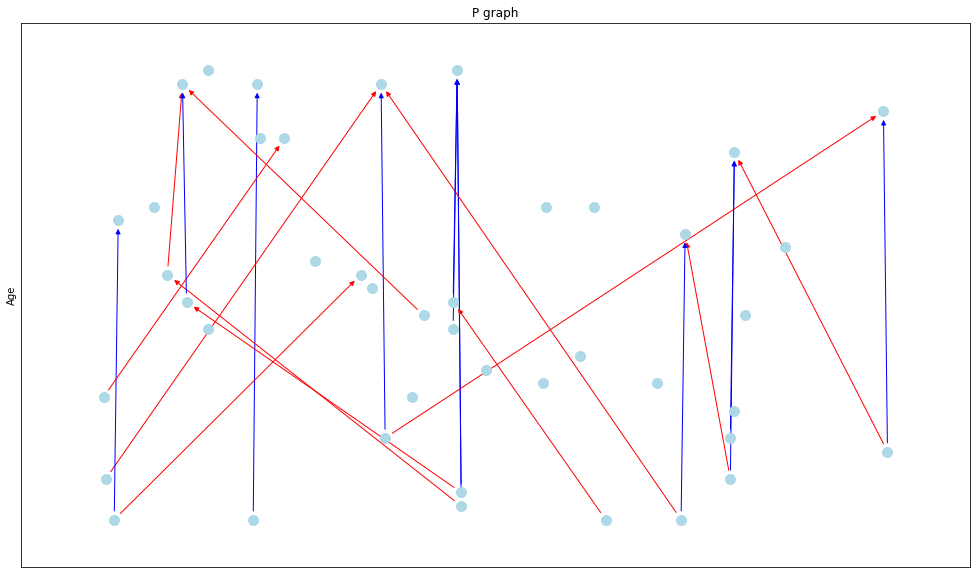

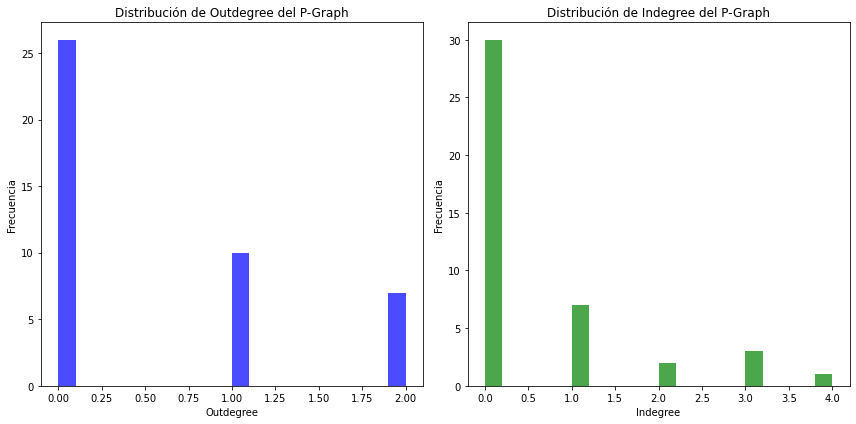

tamos en tiempo 200 con vivas 44


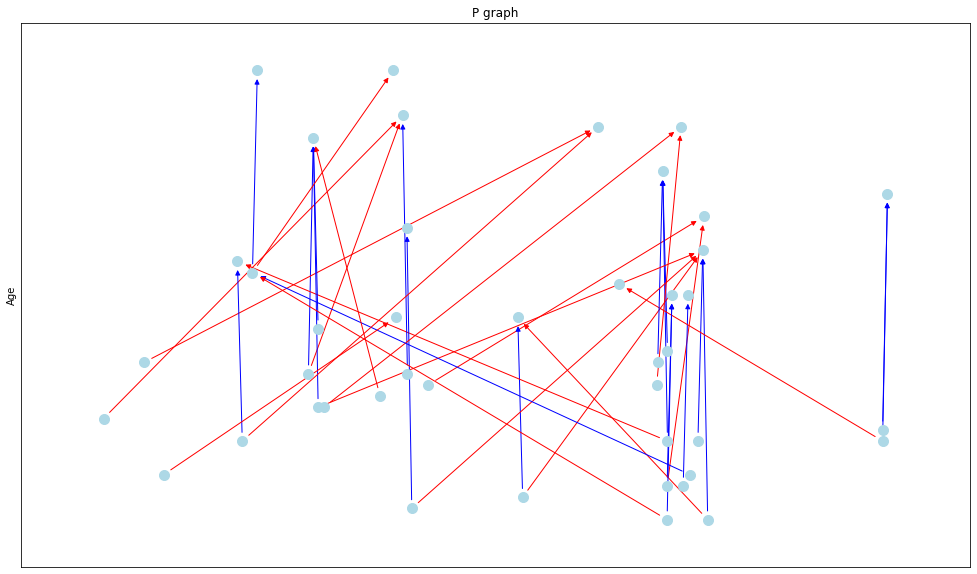

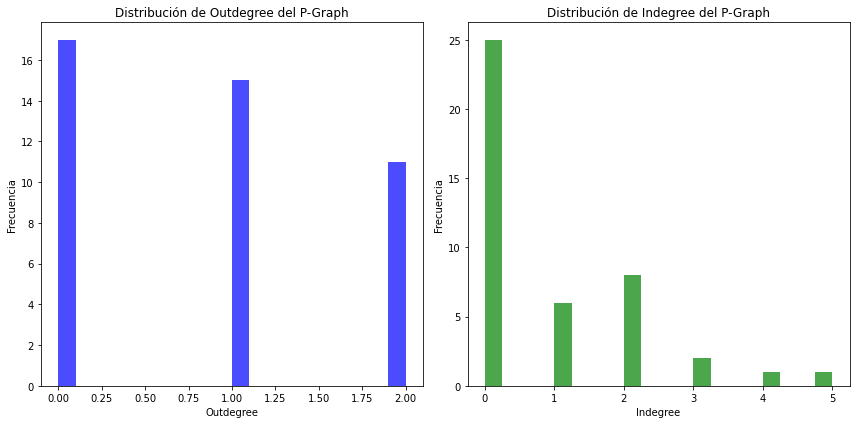

tamos en tiempo 300 con vivas 59


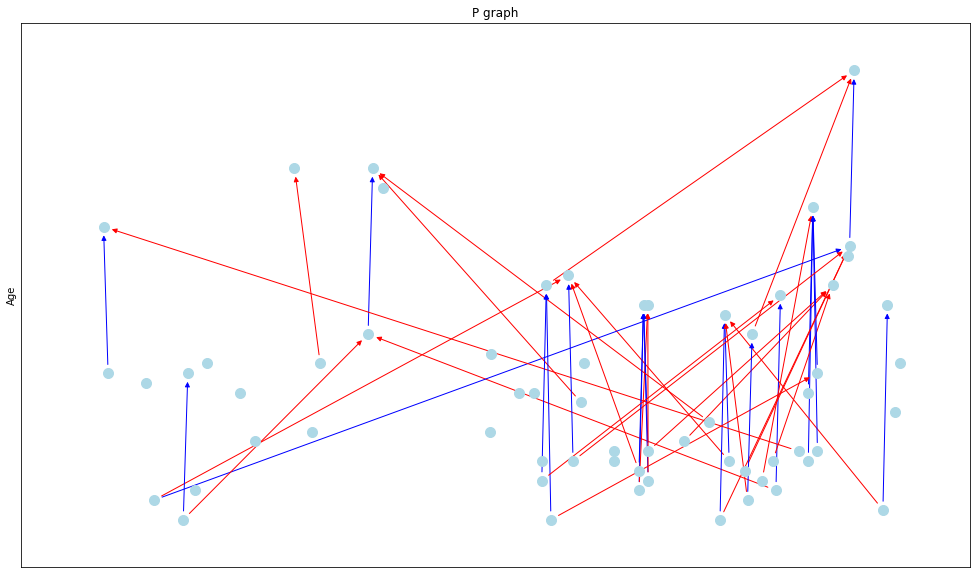

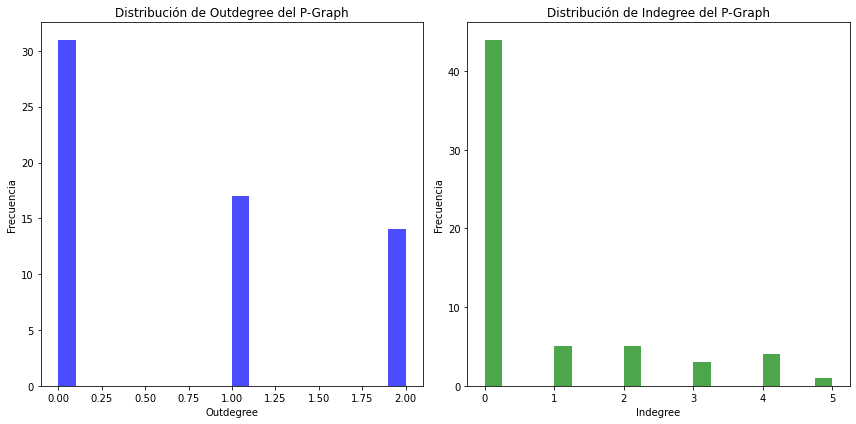

tamos en tiempo 400 con vivas 123


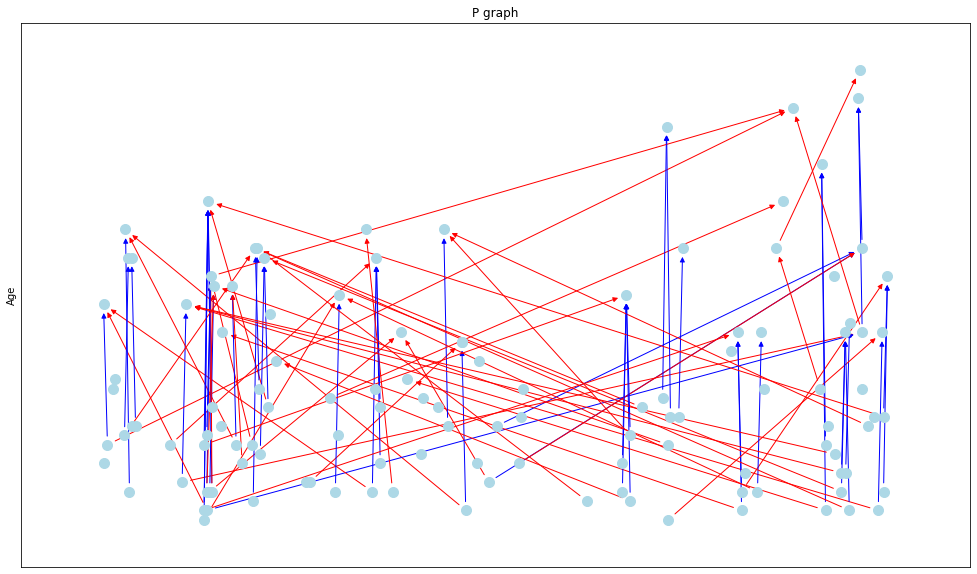

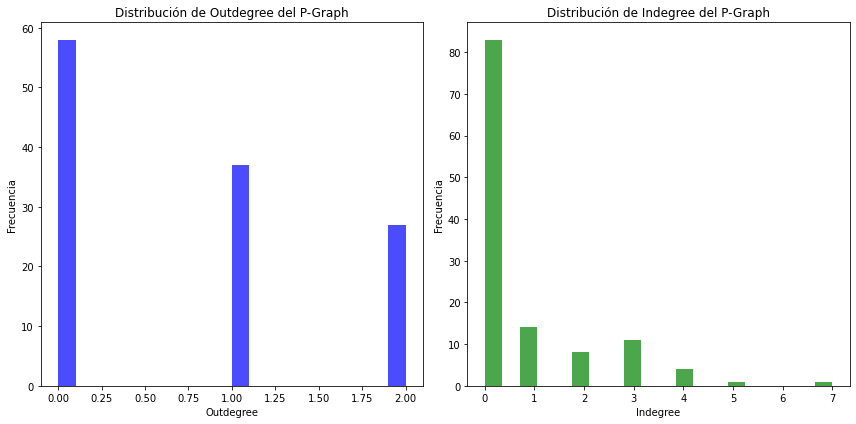

tamos en tiempo 500 con vivas 208


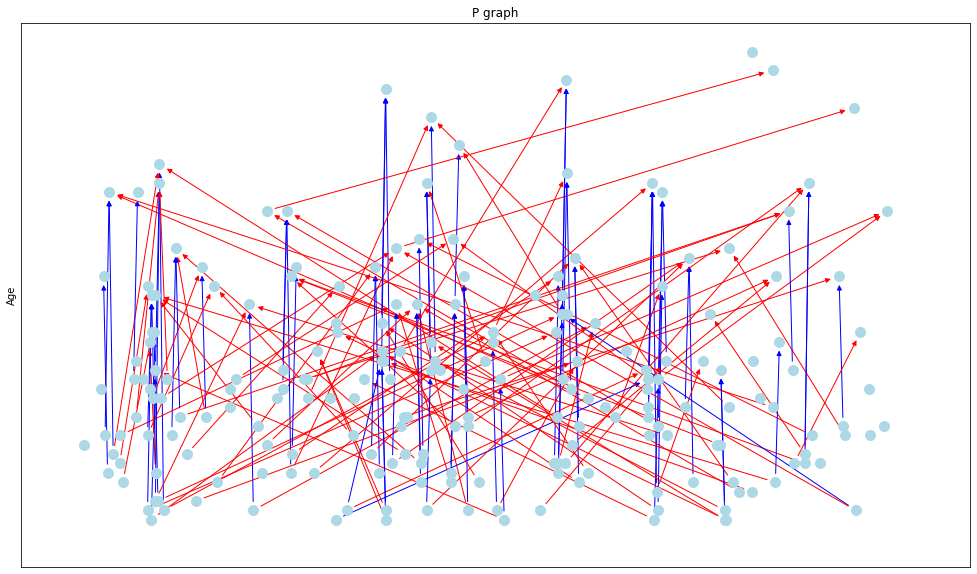

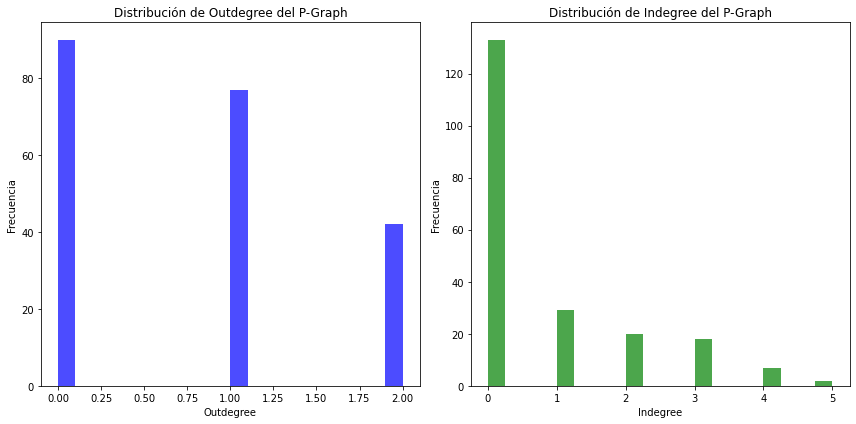

tamos en tiempo 600 con vivas 123


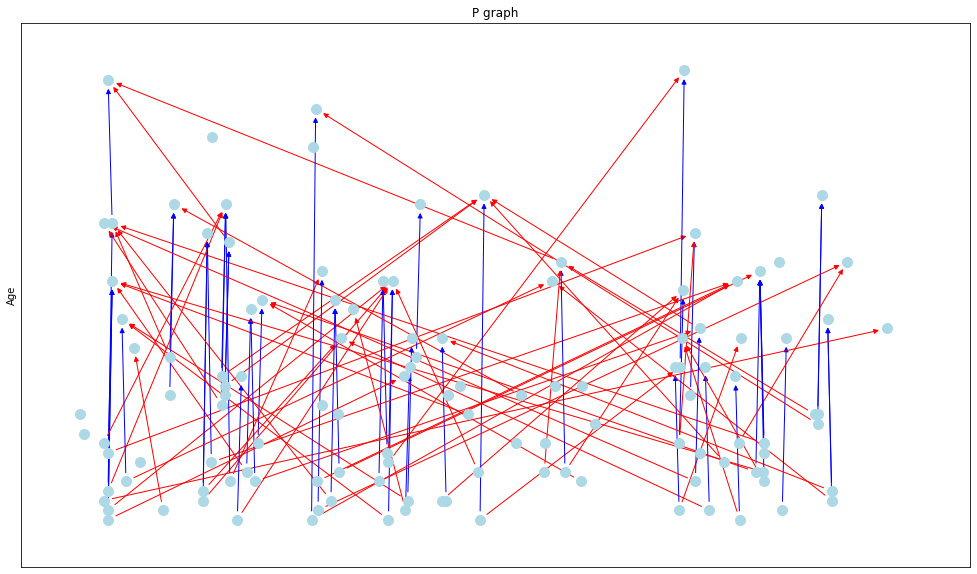

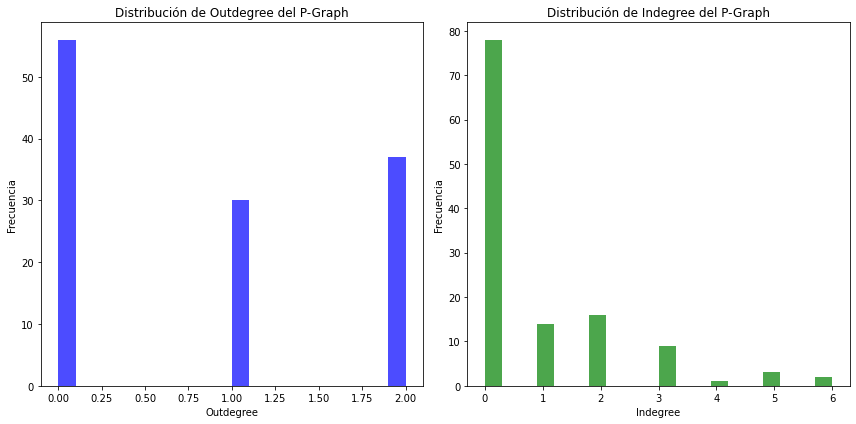

tamos en tiempo 700 con vivas 178


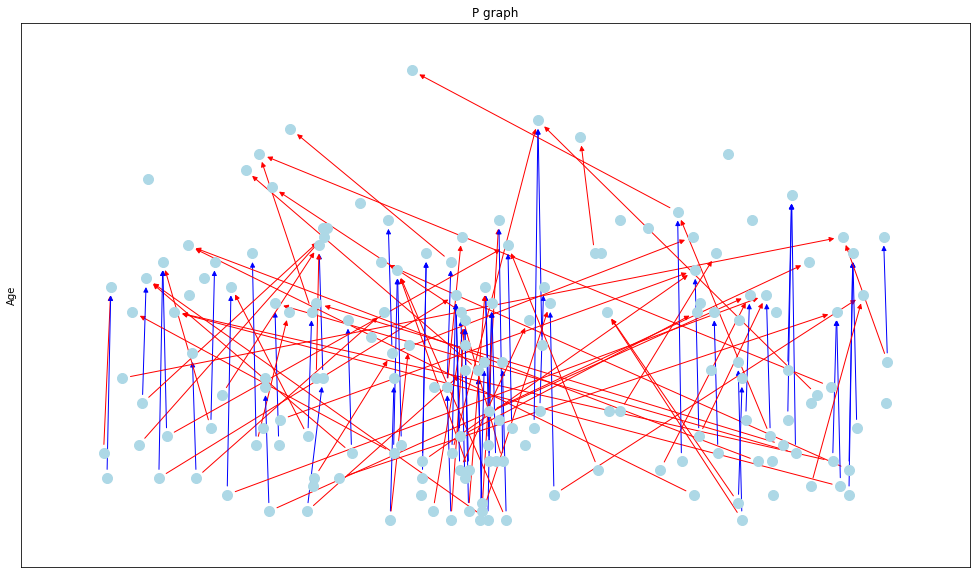

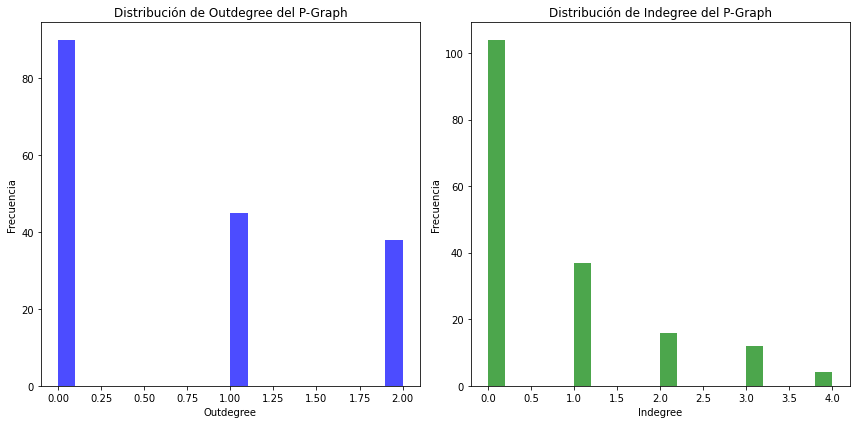

tamos en tiempo 800 con vivas 101


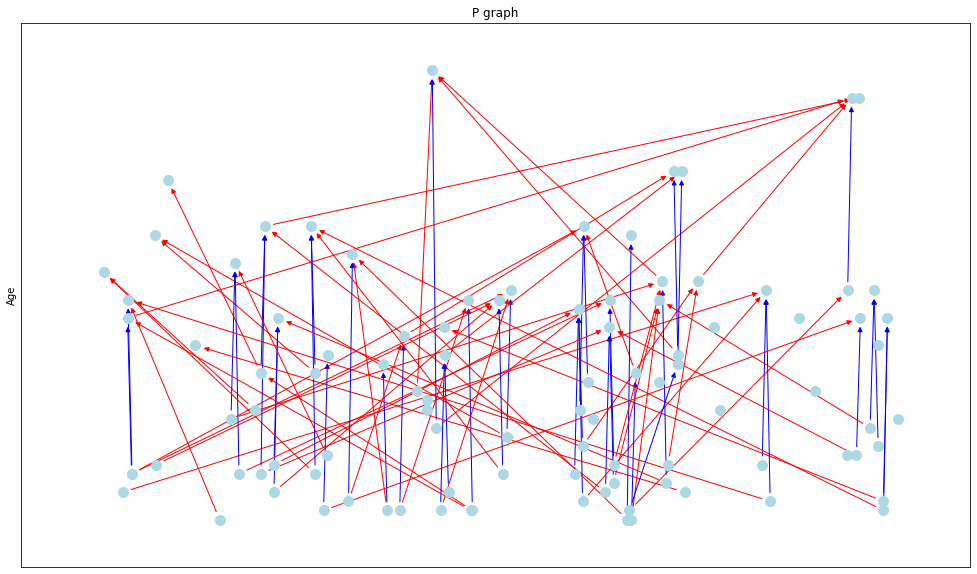

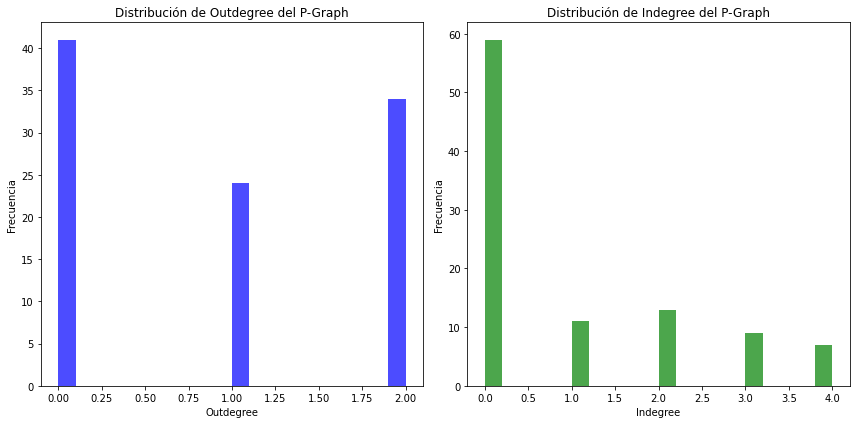

tamos en tiempo 900 con vivas 126


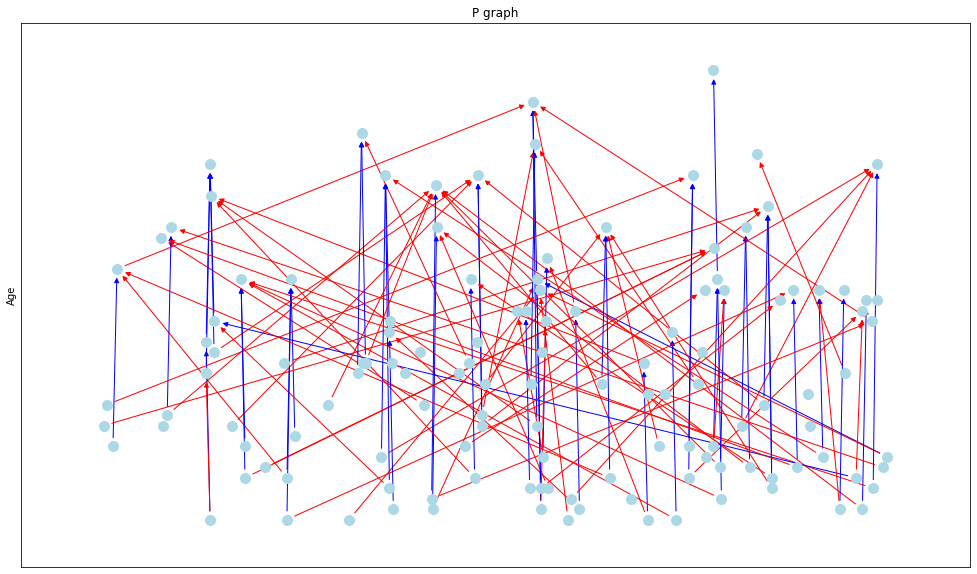

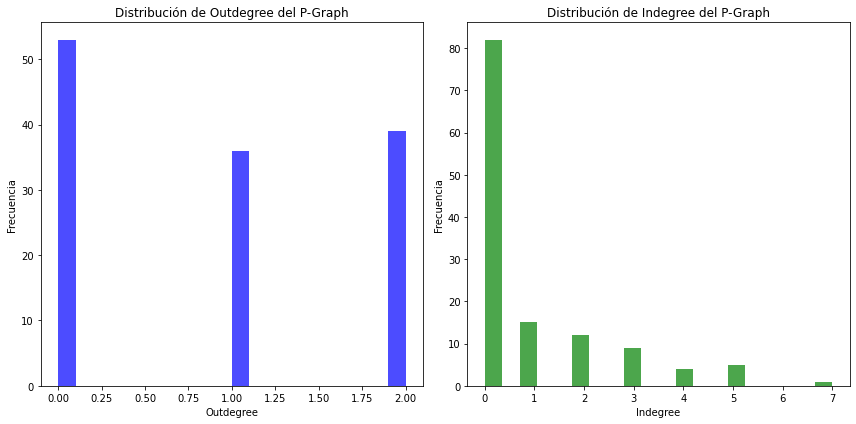

tamos en tiempo 1000 con vivas 162


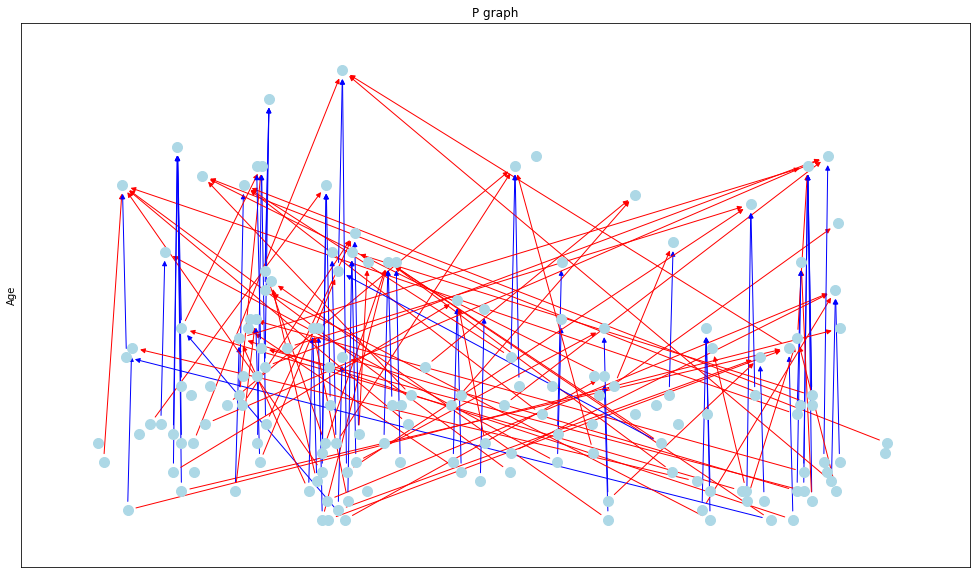

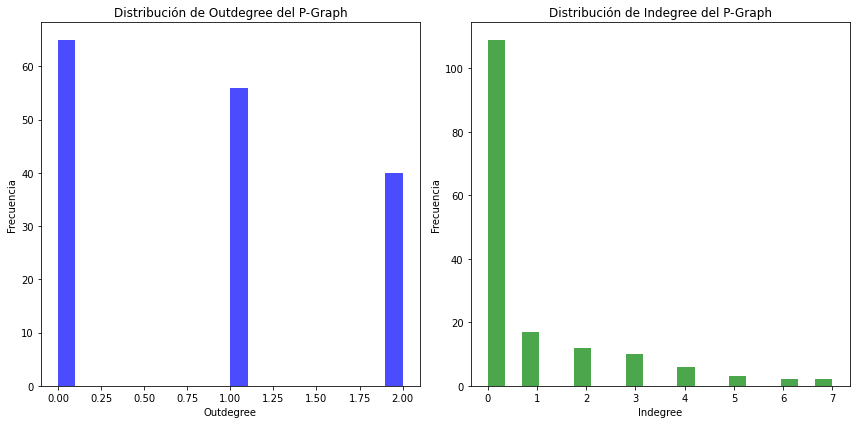

tamos en tiempo 1100 con vivas 101


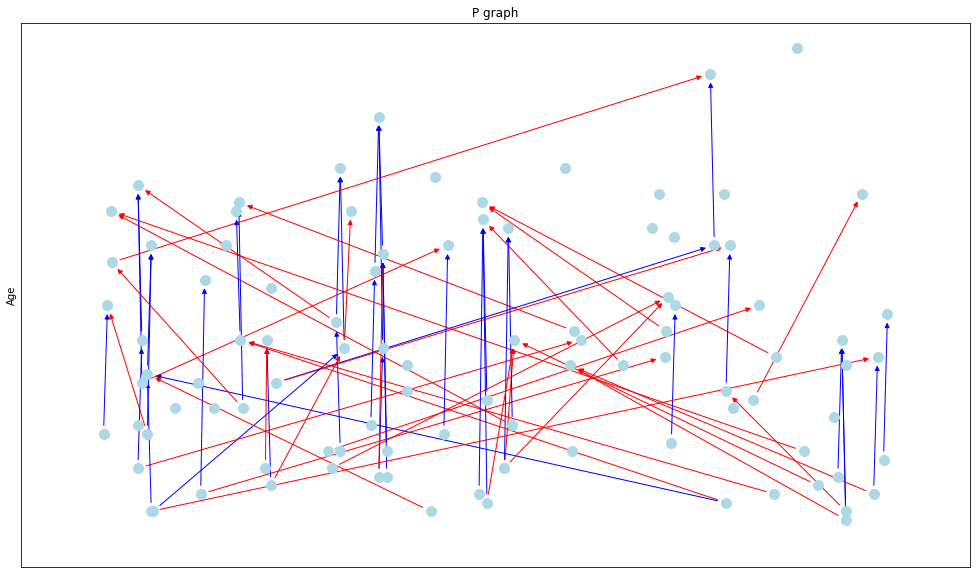

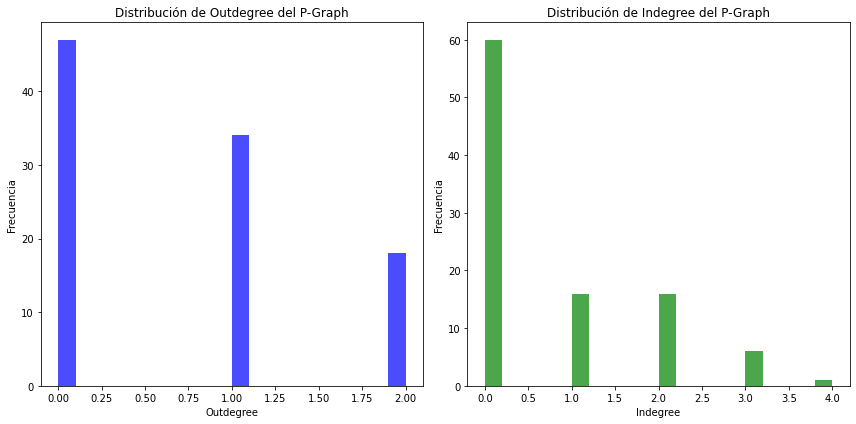

tamos en tiempo 1200 con vivas 124


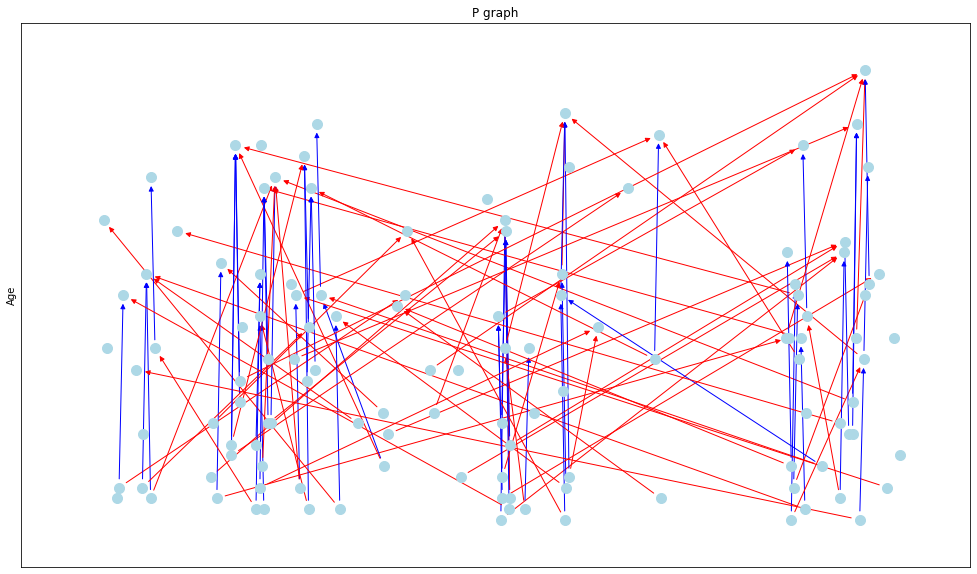

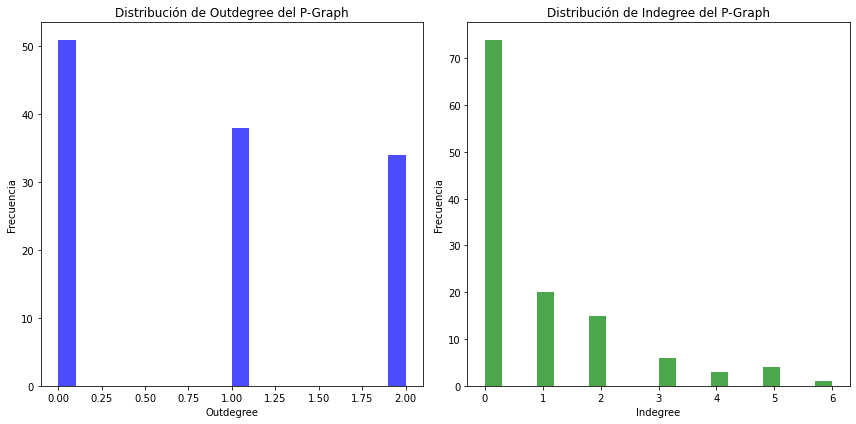

123


In [2]:
#ENDOGAMY CONTROL POPULATION
#Parameters UD_endogamy_al_inh
iniciais = 40 # Initial UD
prob_morte = 0.06 # Beta from the gutertz equation
mediao = 4 # Average children per UD
#random.seed(42) # Random seed
t = 1200 #steps of the simulation
dataset = [] # For the dataset
#### Initialization endogamy
## clans
UD_endogamy_al_inh.uds = {}
instancias_ud = []
original_media = mediao
media = original_media
for id_ud in range(1, int(iniciais) + 1):
        instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
## Varieties
limited_varieties = True
if limited_varieties == False:
    for id_ud, ud in UD_endogamy_al_inh.uds.items():
        for _ in range(3):
            ud.varieties.append(Variety())
else:
    initial_varieties = [Variety() for _ in range (10)]
    for ud in UD_endogamy_al_inh.uds.values():
        for _ in range(3):
            ud.varieties.append(random.choice(initial_varieties))
#### Simulation endogamy
vivas = [int(iniciais)]
for i in range (1, (t+1)):
    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
    # Convertir el diccionario en una lista de pares (clave, valor)
    items = list(uds_copy.items())
    random.shuffle(items)
    uds_copy = dict(items)
    alive = len(uds_copy)
    if alive > 200 and (media == original_media): #or media == original_media-1):
        media -= media//2
        if media >= 4:
            media = media //2
        #print(f' no ano {i} temos a media {media}')
    elif alive < 150 and media < original_media:
        media = original_media
        #print(f' no ano {i} temos a media {media}')
    if not uds_copy:
        print("acabo")
        break
    # Cycle: 
    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
    for id_ud, ud in uds_copy.items():
        ud.ter_filho()
        ud.buscar_ud(uds_copy, media, varieties_list, 3)
        ud.incrementar_idade()
        ud.death_probability(prob_morte)
    # Visualizations
    if i % 100 == 0: 
        #create_vis_geral(uds_copy, True)
        #dataset = general_charactersitics_data(i, uds_copy, dataset, False, False)
        #G = marriage_graph_attribute(uds_copy, "clan", False)
        # community
        #results_community = count_links_between_and_within(G, 'clan')
        #p_graph_attribute(uds_copy, "clan", True)
        print(f"tamos en tiempo {i} con vivas {viv}")
        p_graph(uds_copy, True)

    # Collecting data for population
    viv = len([ud for id, ud in uds_copy.items() if ud.activa])
    vivas.append(viv)        
print(len([ud for id, ud in uds_copy.items() if ud.activa]))
#dataset = general_charactersitics_data(i, uds_copy, dataset, True, False)

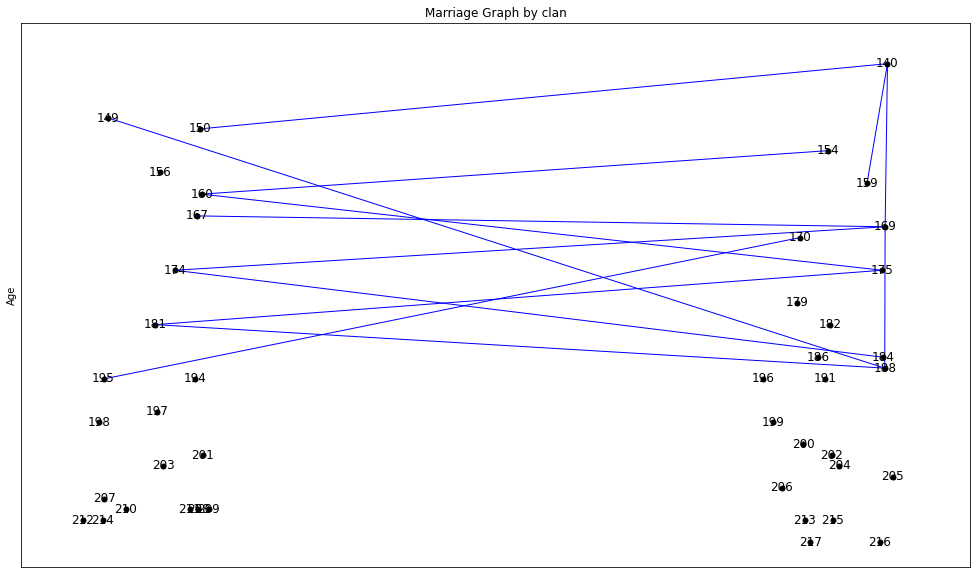

Total de enlaces: 13
Links inside the clan '2': 23.08%
Linkgs outside the clan '1' and '2': 53.85%
Linkgs outside the clan '2' and '1': 23.08%


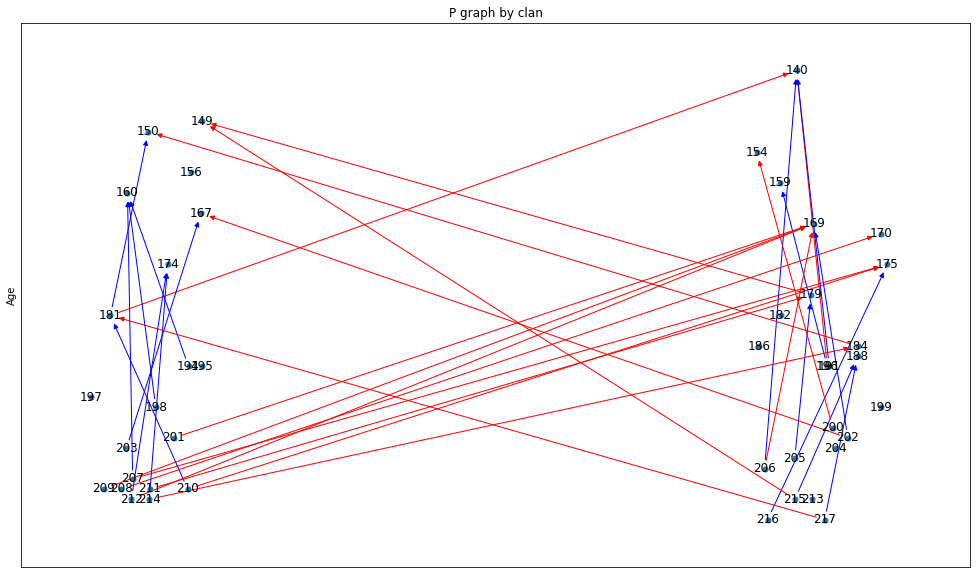

tamos en tiempo 100 con vivas 43


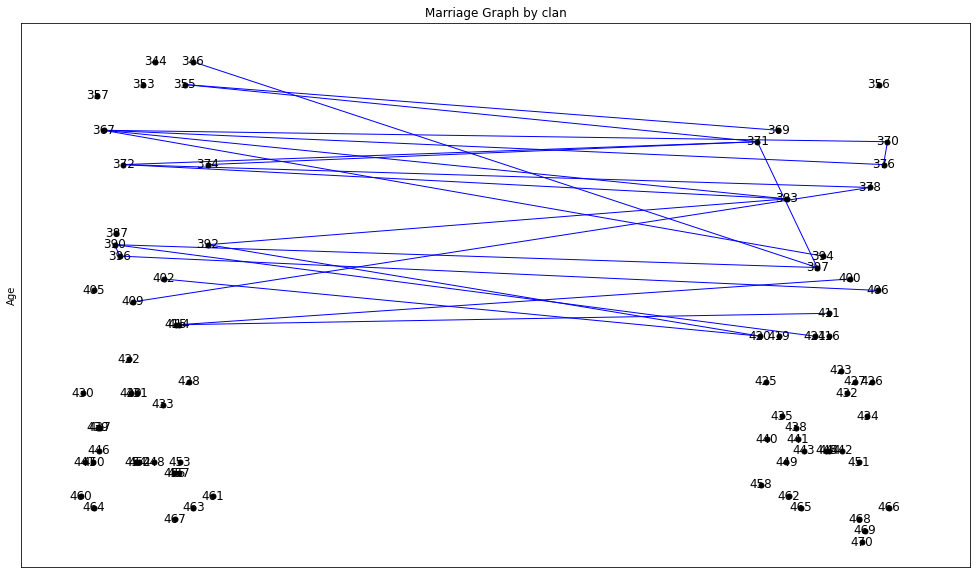

Total de enlaces: 23
Links inside the clan '1': 4.35%
Links inside the clan '2': 8.70%
Linkgs outside the clan '1' and '2': 60.87%
Linkgs outside the clan '2' and '1': 26.09%


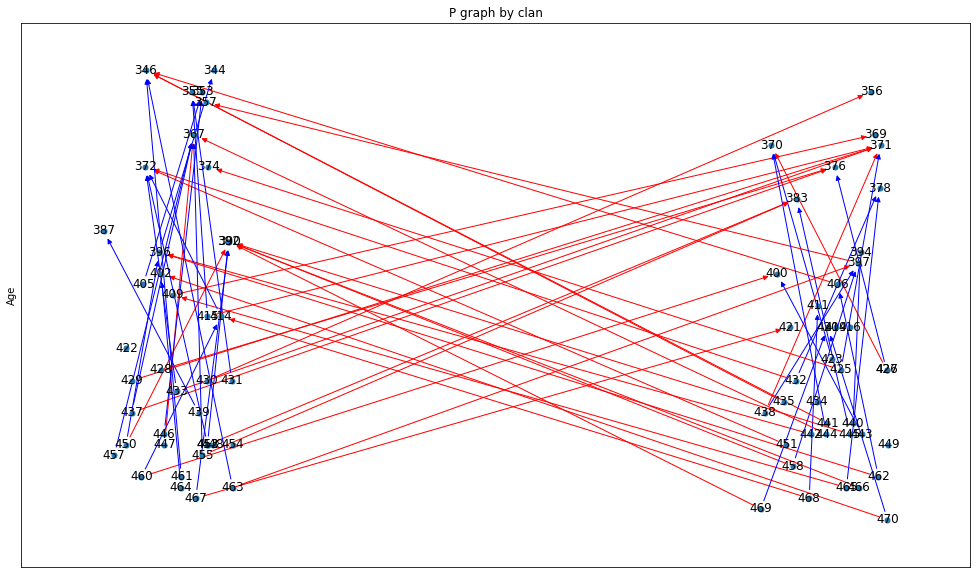

tamos en tiempo 200 con vivas 77


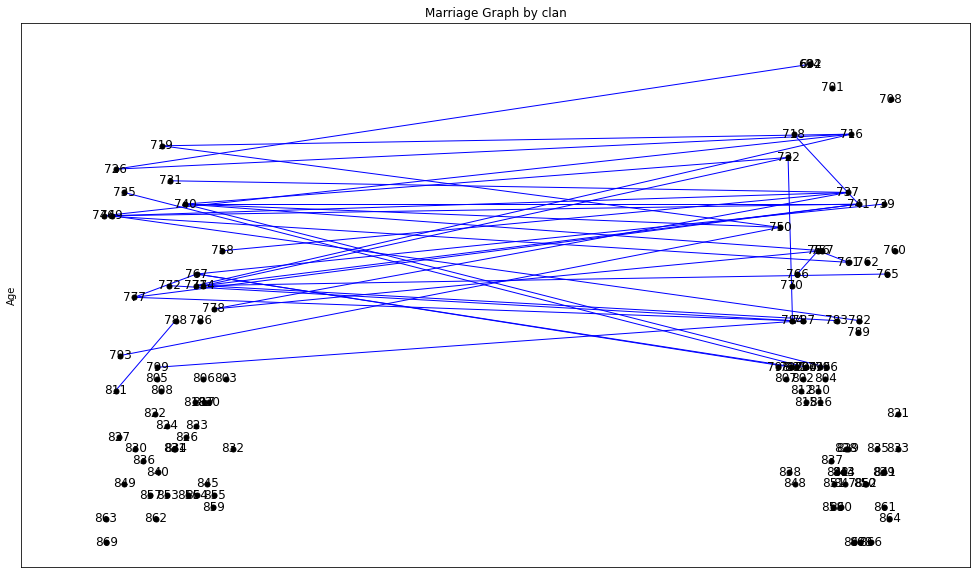

Total de enlaces: 38
Links inside the clan '1': 5.26%
Links inside the clan '2': 10.53%
Linkgs outside the clan '1' and '2': 34.21%
Linkgs outside the clan '2' and '1': 50.00%


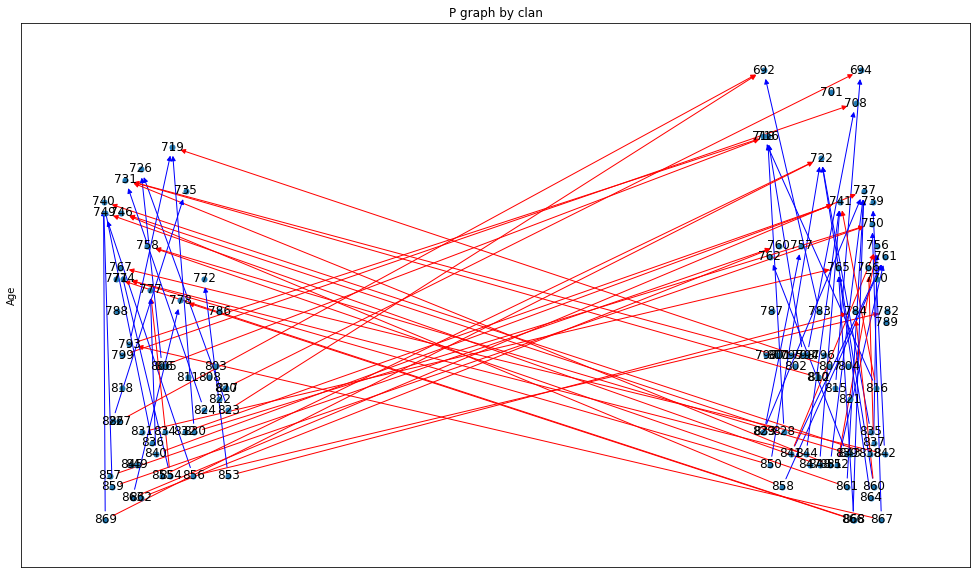

tamos en tiempo 300 con vivas 106


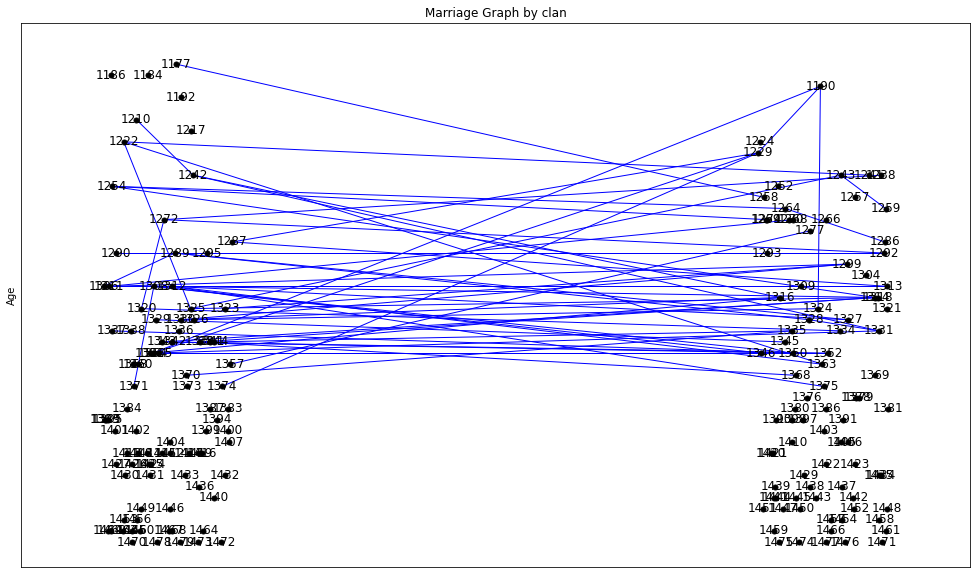

Total de enlaces: 58
Links inside the clan '1': 8.62%
Links inside the clan '2': 8.62%
Linkgs outside the clan '2' and '1': 39.66%
Linkgs outside the clan '1' and '2': 43.10%


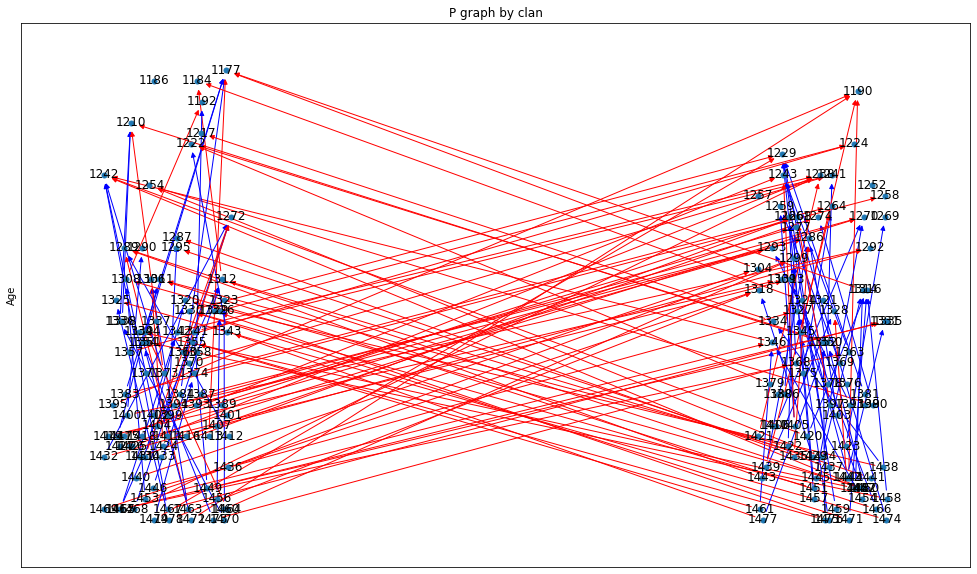

tamos en tiempo 400 con vivas 167


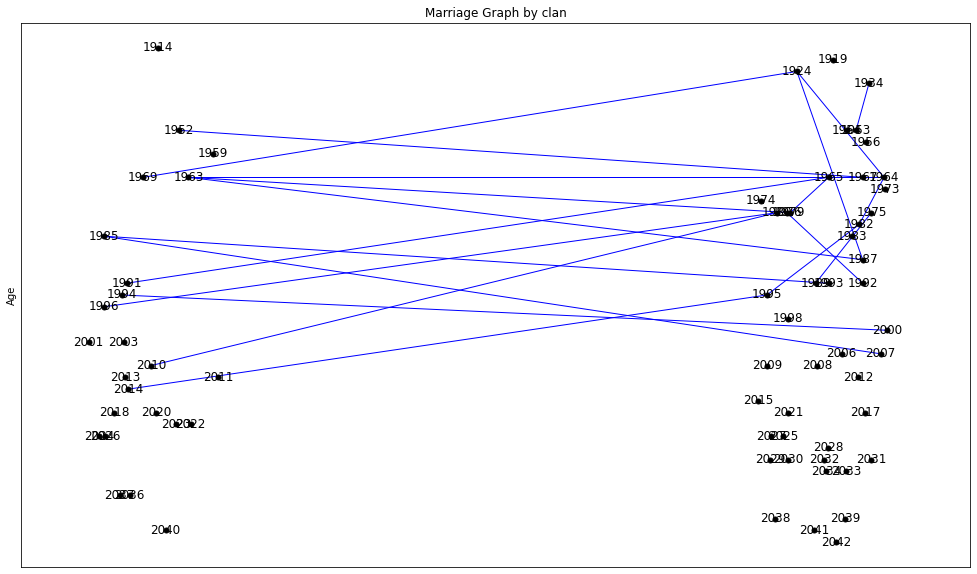

Total de enlaces: 21
Links inside the clan '2': 42.86%
Linkgs outside the clan '2' and '1': 14.29%
Linkgs outside the clan '1' and '2': 42.86%


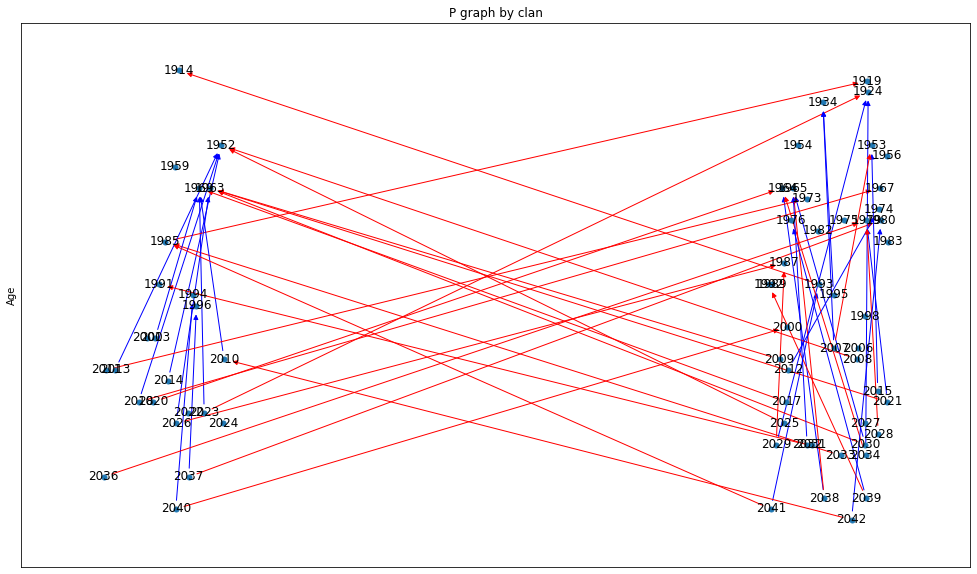

tamos en tiempo 500 con vivas 68


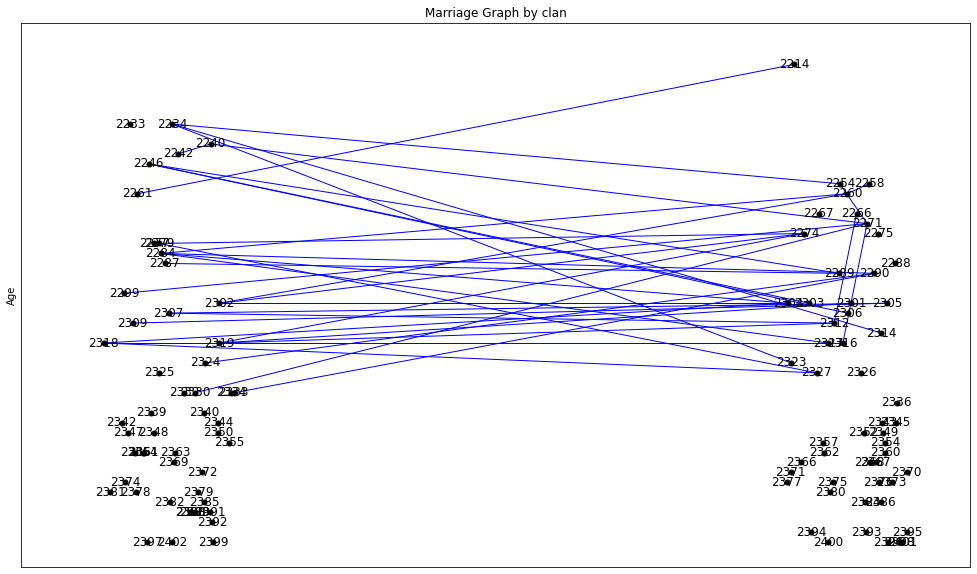

Total de enlaces: 37
Links inside the clan '1': 2.70%
Links inside the clan '2': 10.81%
Linkgs outside the clan '1' and '2': 45.95%
Linkgs outside the clan '2' and '1': 40.54%


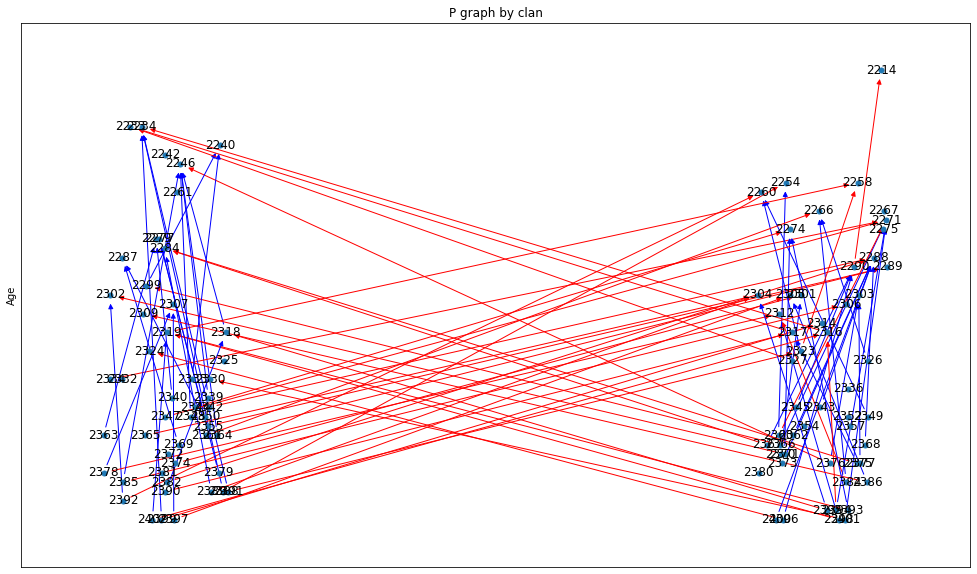

tamos en tiempo 600 con vivas 95


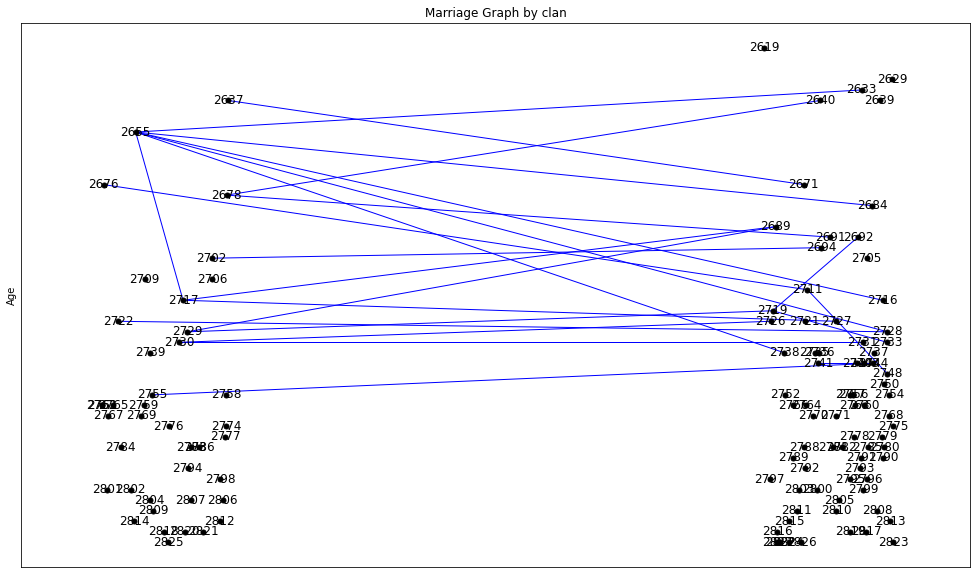

Total de enlaces: 23
Links inside the clan '2': 17.39%
Links inside the clan '1': 4.35%
Linkgs outside the clan '2' and '1': 43.48%
Linkgs outside the clan '1' and '2': 34.78%


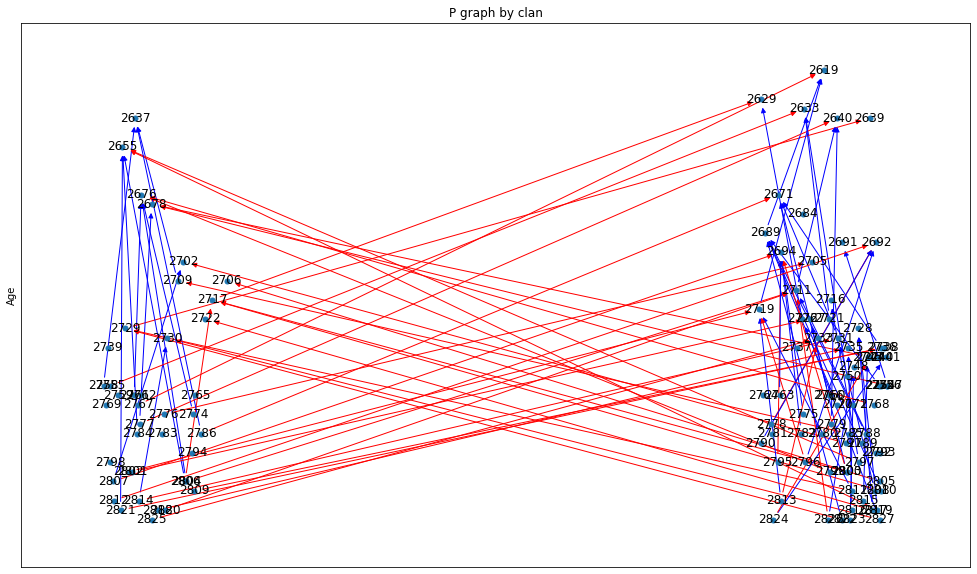

tamos en tiempo 700 con vivas 109


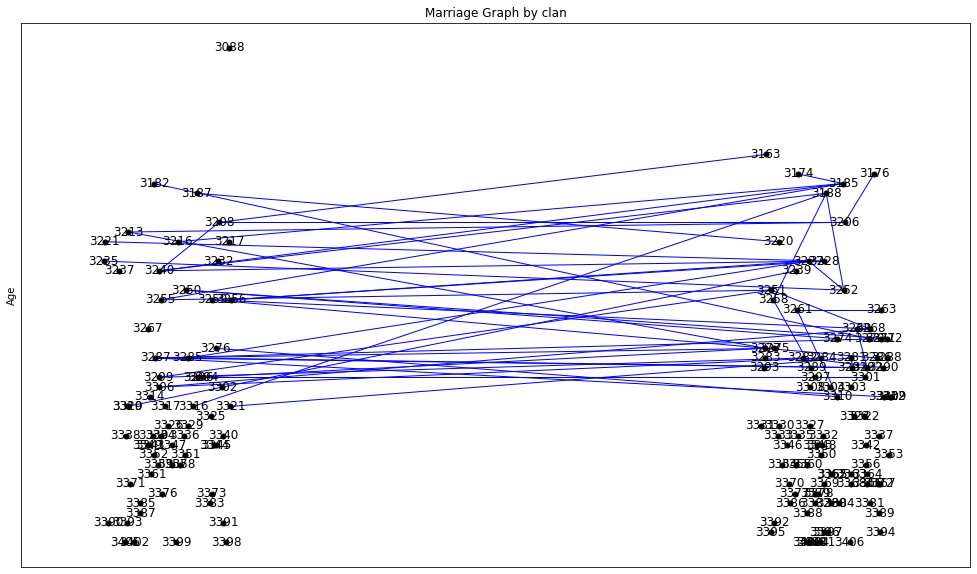

Total de enlaces: 50
Links inside the clan '2': 24.00%
Links inside the clan '1': 2.00%
Linkgs outside the clan '2' and '1': 20.00%
Linkgs outside the clan '1' and '2': 54.00%


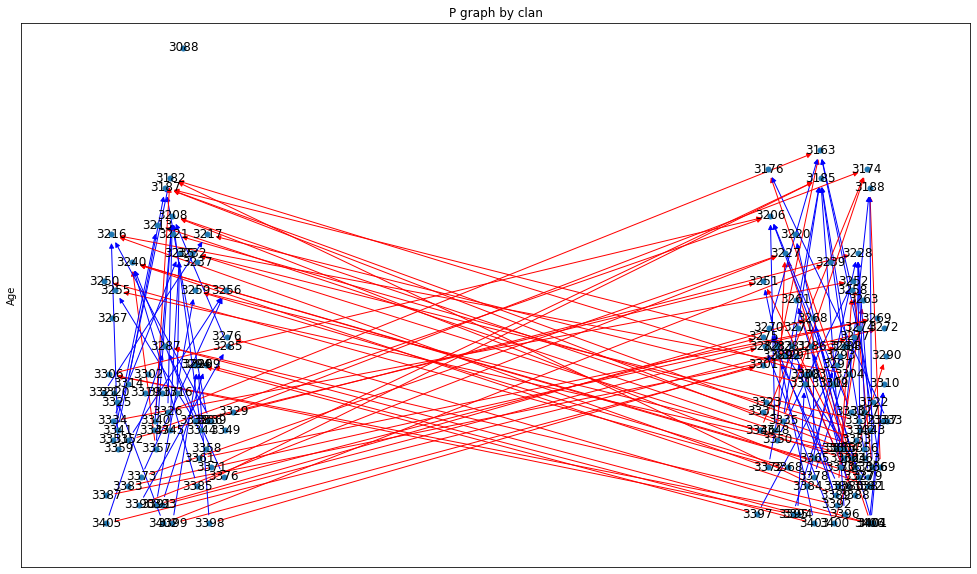

tamos en tiempo 800 con vivas 146


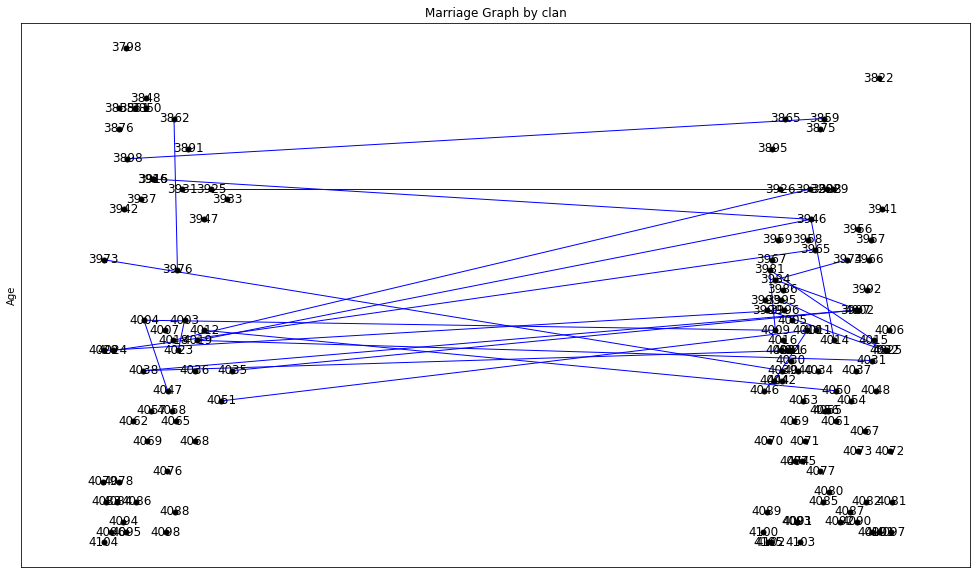

Total de enlaces: 26
Links inside the clan '1': 11.54%
Links inside the clan '2': 30.77%
Linkgs outside the clan '1' and '2': 19.23%
Linkgs outside the clan '2' and '1': 38.46%


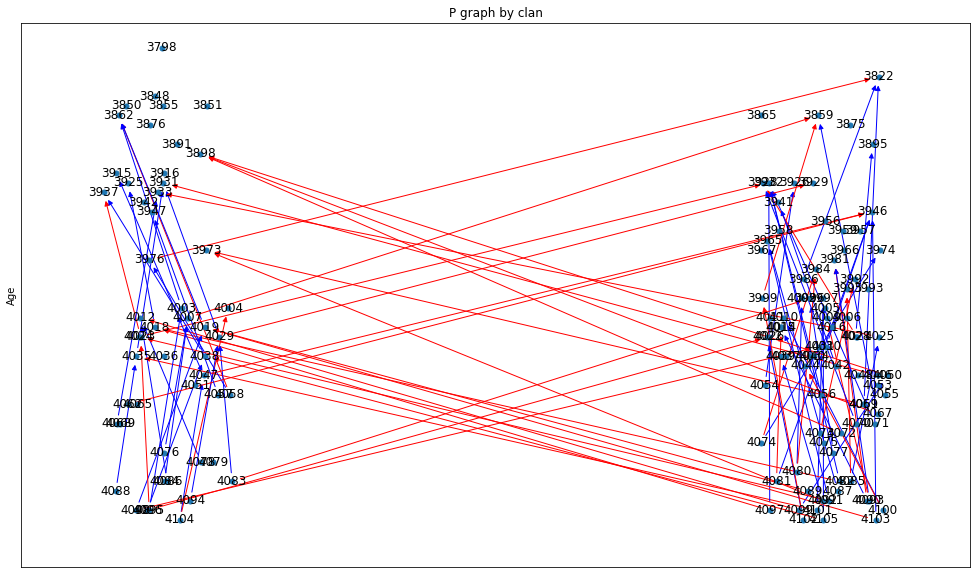

tamos en tiempo 900 con vivas 131


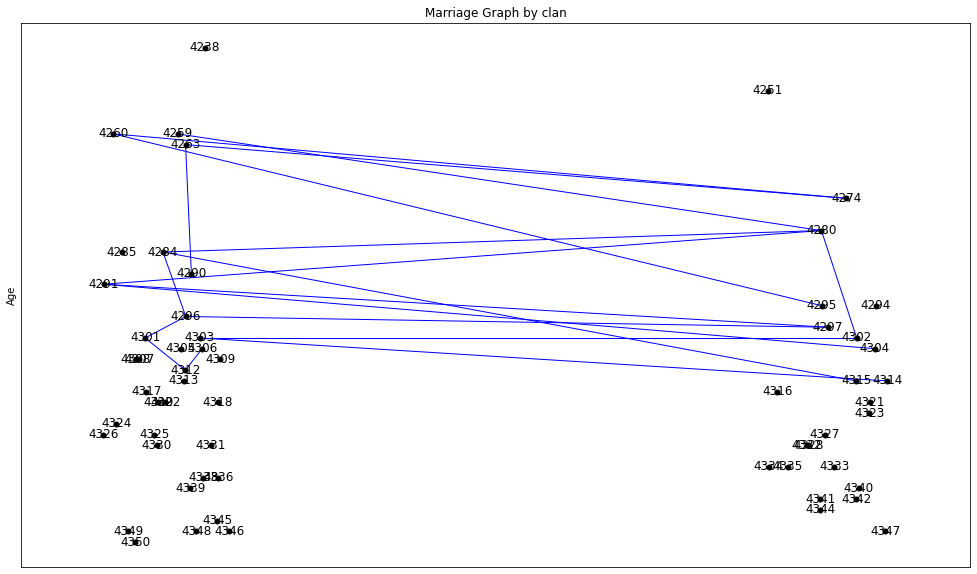

Total de enlaces: 18
Links inside the clan '1': 27.78%
Links inside the clan '2': 5.56%
Linkgs outside the clan '1' and '2': 16.67%
Linkgs outside the clan '2' and '1': 50.00%


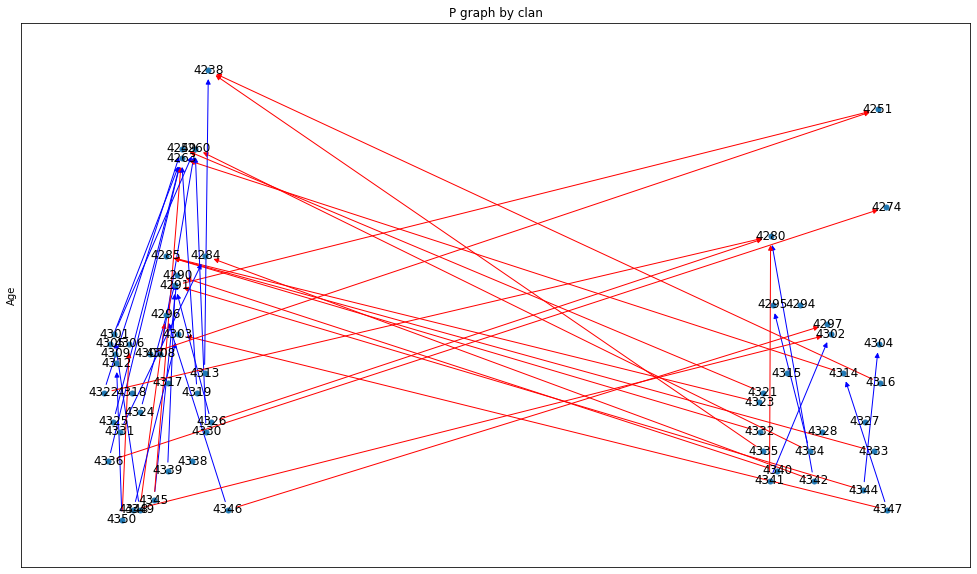

tamos en tiempo 1000 con vivas 58


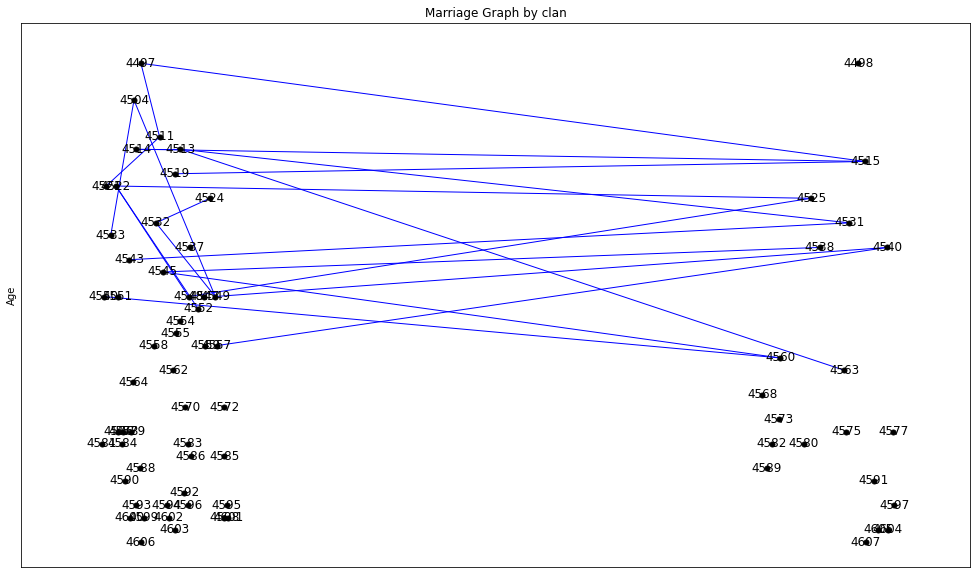

Total de enlaces: 22
Links inside the clan '1': 40.91%
Linkgs outside the clan '2' and '1': 40.91%
Linkgs outside the clan '1' and '2': 18.18%


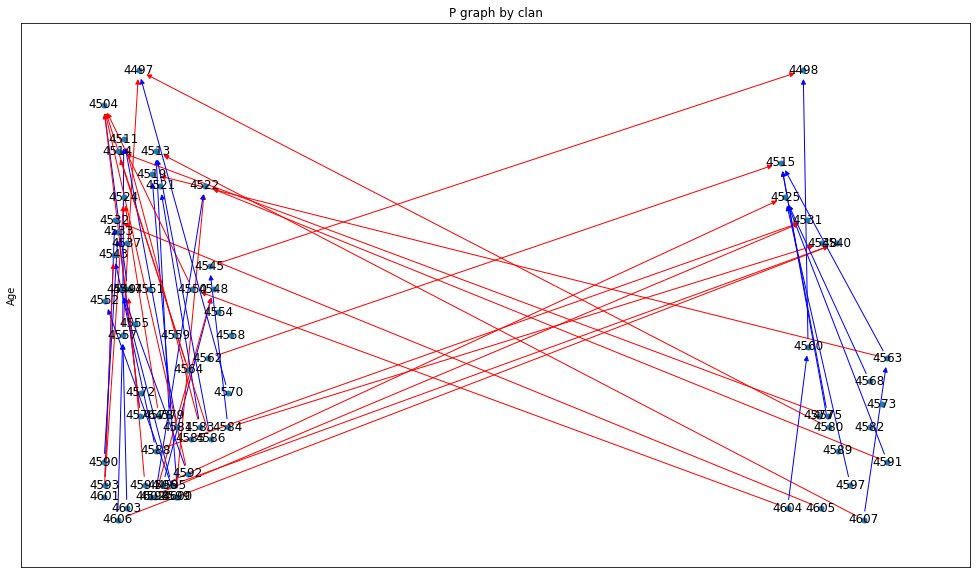

tamos en tiempo 1100 con vivas 69


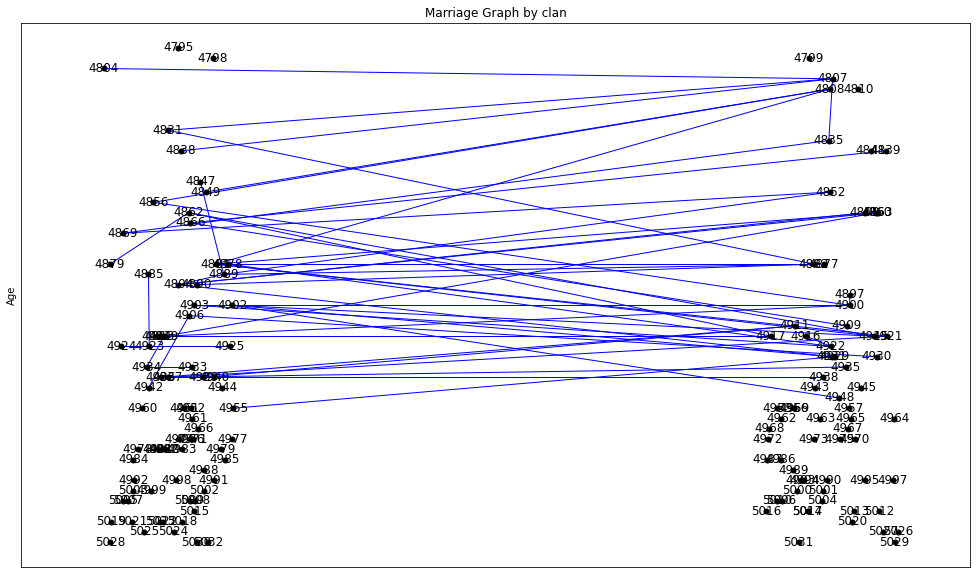

Total de enlaces: 51
Links inside the clan '2': 5.88%
Links inside the clan '1': 15.69%
Linkgs outside the clan '1' and '2': 29.41%
Linkgs outside the clan '2' and '1': 49.02%


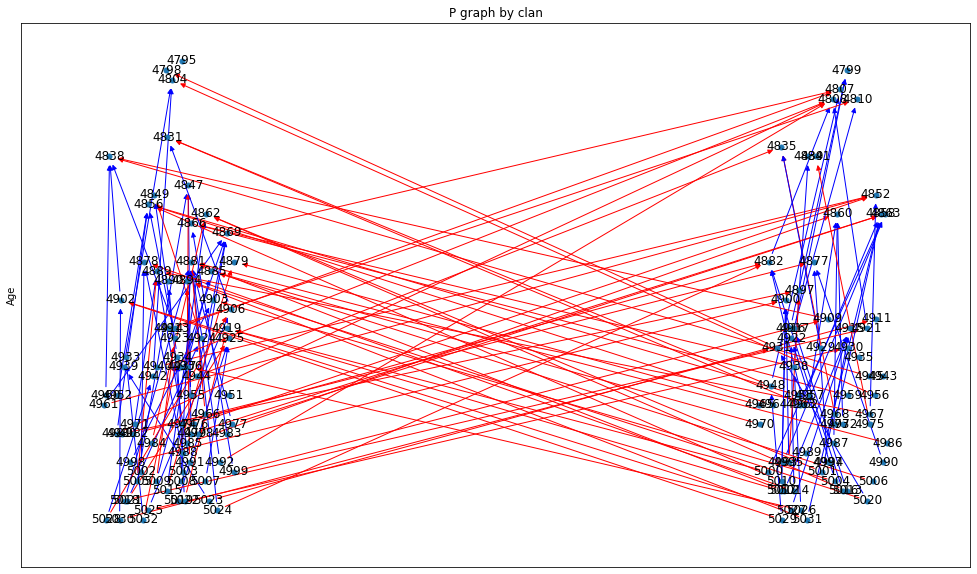

tamos en tiempo 1200 con vivas 137
138


In [3]:
#DUAL ORGANIZATION CONTROL POPULATION
#Parameters dual_organization
iniciais = 40 # Initial UD
clanes = [1,2]
clans = (clanes * (iniciais // 2)) + clanes[:(iniciais % 2)]
random.shuffle(clans)
prob_morte = 0.06 # Beta from the gutertz equation
mediao = 4 # Average children per UD
random.seed(42) # Random seed
t = 1200 #steps of the simulation
dataset = [] #For the data
original_media = mediao
media = original_media
#### Initialization dual_organization
## Clans
UD_dual_organization_al_inh.uds = {}
instancias_ud = []
for id_ud in range(1, int(iniciais) + 1):
        instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
## Varieties
limited_varieties = True
if limited_varieties == False:
    for id_ud, ud in UD_dual_organization_al_inh.uds.items():
        for _ in range(3):
            ud.varieties.append(Variety())
else:
    initial_varieties = [Variety() for _ in range (10)]
    for ud in UD_dual_organization_al_inh.uds.values():
        for _ in range(3):
            ud.varieties.append(random.choice(initial_varieties))
#### Simulation dual_organization
vivas = [int(iniciais)]
for i in range (1, (t+1)):
    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
    # Convertir el diccionario en una lista de pares (clave, valor)
    items = list(uds_copy.items())
    random.shuffle(items)
    uds_copy = dict(items)
    alive = len(uds_copy)
    if alive > 200 and (media == original_media): #or media == original_media-1):
        media -= media//2
        if media >= 4:
            media = media //2
        #print(f' no ano {i} temos a media {media}')
    elif alive < 150 and media < original_media:
        media = original_media
        #print(f' no ano {i} temos a media {media}')
    if not uds_copy:
        print("acabo")
        break
    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
    for id_ud, ud in uds_copy.items():
        ud.ter_filho()
        ud.buscar_ud(uds_copy, media, varieties_list, True, 3, 0.2)
        ud.incrementar_idade()
        ud.death_probability(prob_morte)
    if i % 100 == 0:
        #create_vis_geral(uds_copy, True)
        Gcl = marriage_graph_attribute(uds_copy, "clan", False)
        # clan
        results_clan = count_links_between_and_within(Gcl, "clan")
        p_graph_attribute(uds_copy, "clan", False)
        # Get the dyacronic data
        #dataset = general_charactersitics_data(i, uds_copy, dataset, False, True)
        print(f"tamos en tiempo {i} con vivas {viv}")

    # Collecting data for populational dynamics
    viv = len([ud for id, ud in uds_copy.items() if ud.activa])
    vivas.append(viv)
        
print(len([ud for id, ud in uds_copy.items() if ud.activa]))
#final = general_charactersitics_data(None, None, dataset, final = True, clan = True)

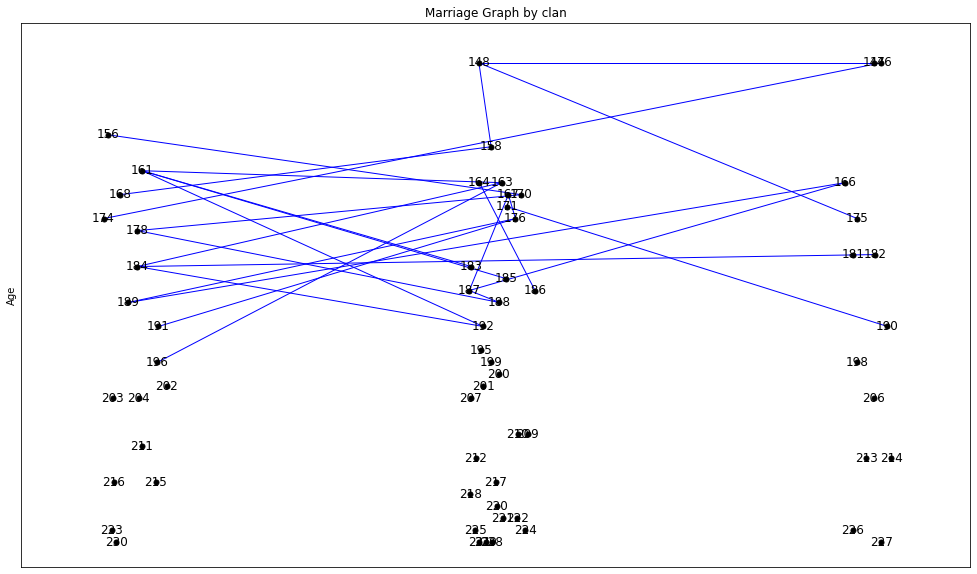

Total de enlaces: 26
Links inside the clan '2': 19.23%
Links inside the clan '3': 3.85%
Linkgs outside the clan '1' and '3': 3.85%
Linkgs outside the clan '1' and '2': 42.31%
Linkgs outside the clan '3' and '1': 7.69%
Linkgs outside the clan '2' and '1': 7.69%
Linkgs outside the clan '3' and '2': 3.85%
Linkgs outside the clan '2' and '3': 11.54%


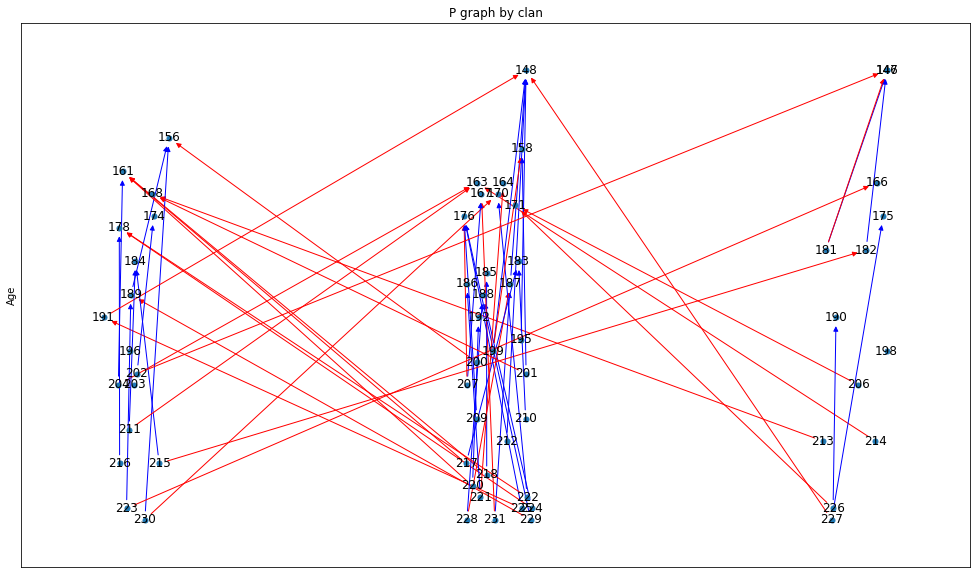

tamos en tiempo 100 con vivas 57


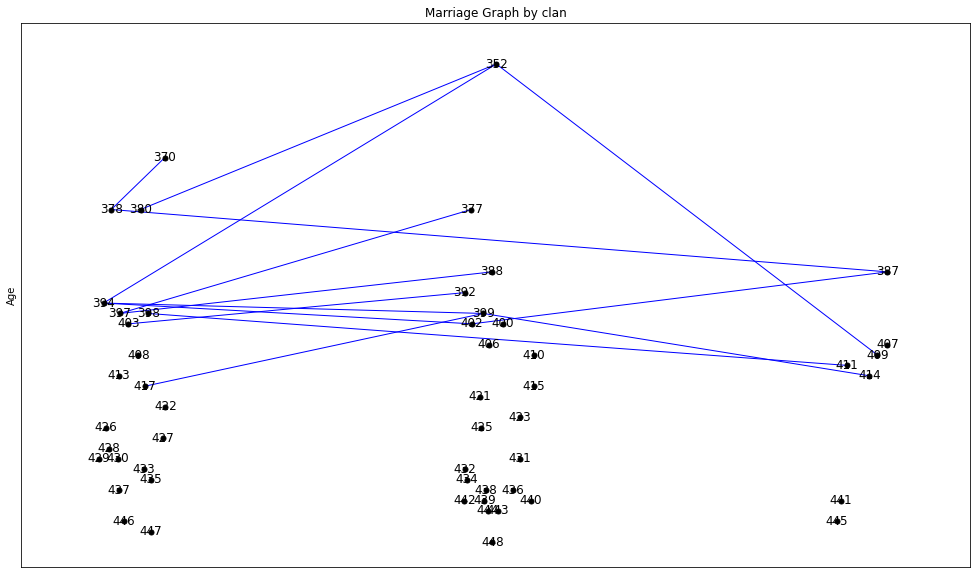

Total de enlaces: 14
Links inside the clan '1': 7.14%
Linkgs outside the clan '2' and '3': 14.29%
Linkgs outside the clan '2' and '1': 42.86%
Linkgs outside the clan '1' and '2': 14.29%
Linkgs outside the clan '3' and '1': 7.14%
Linkgs outside the clan '1' and '3': 7.14%
Linkgs outside the clan '3' and '2': 7.14%


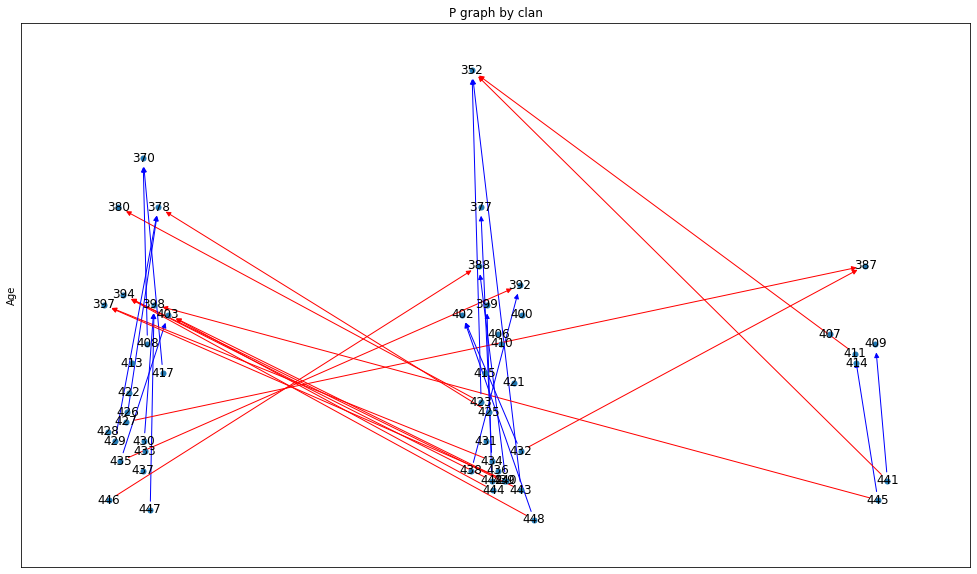

tamos en tiempo 200 con vivas 51


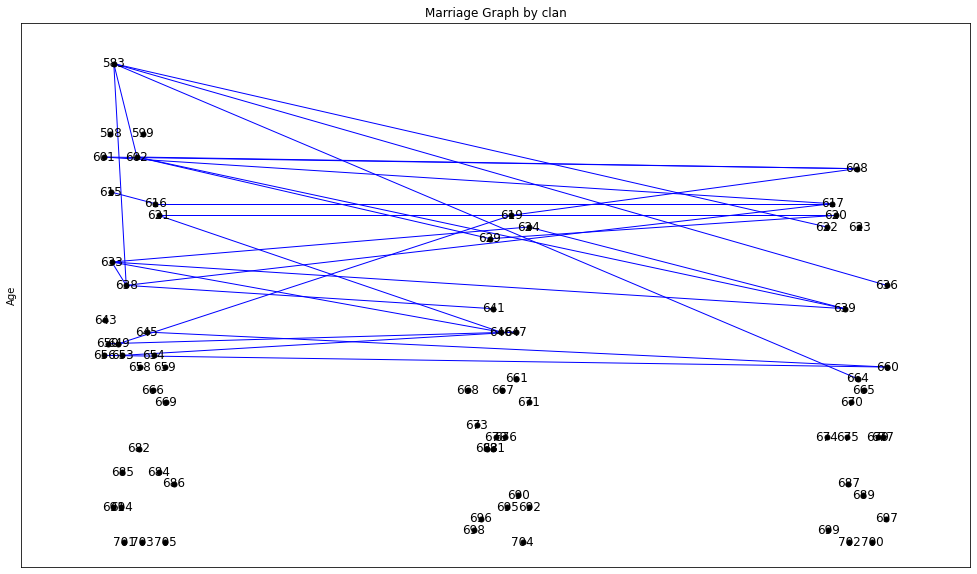

Total de enlaces: 28
Links inside the clan '1': 14.29%
Linkgs outside the clan '1' and '3': 25.00%
Linkgs outside the clan '1' and '2': 14.29%
Linkgs outside the clan '3' and '1': 21.43%
Linkgs outside the clan '2' and '1': 14.29%
Linkgs outside the clan '2' and '3': 3.57%
Linkgs outside the clan '3' and '2': 7.14%


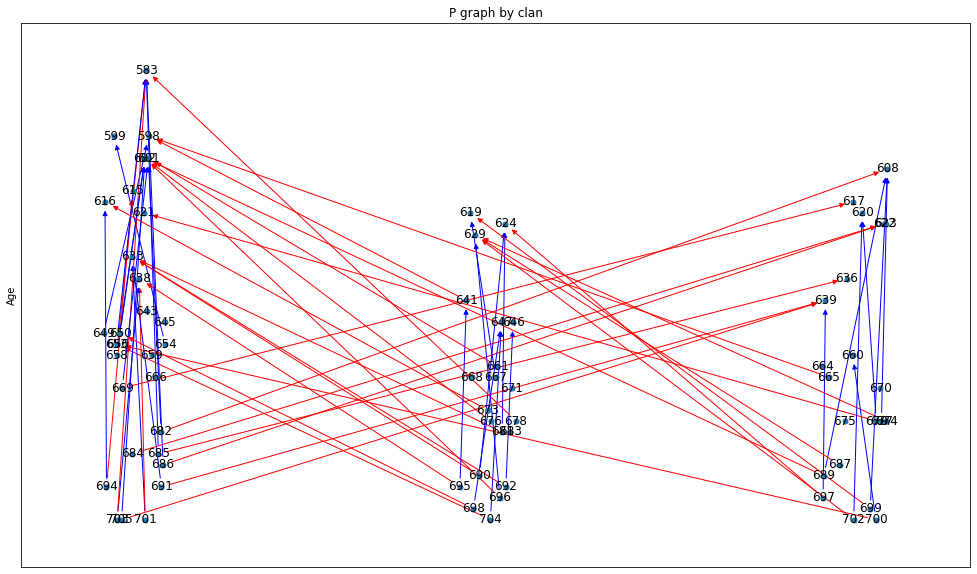

tamos en tiempo 300 con vivas 66


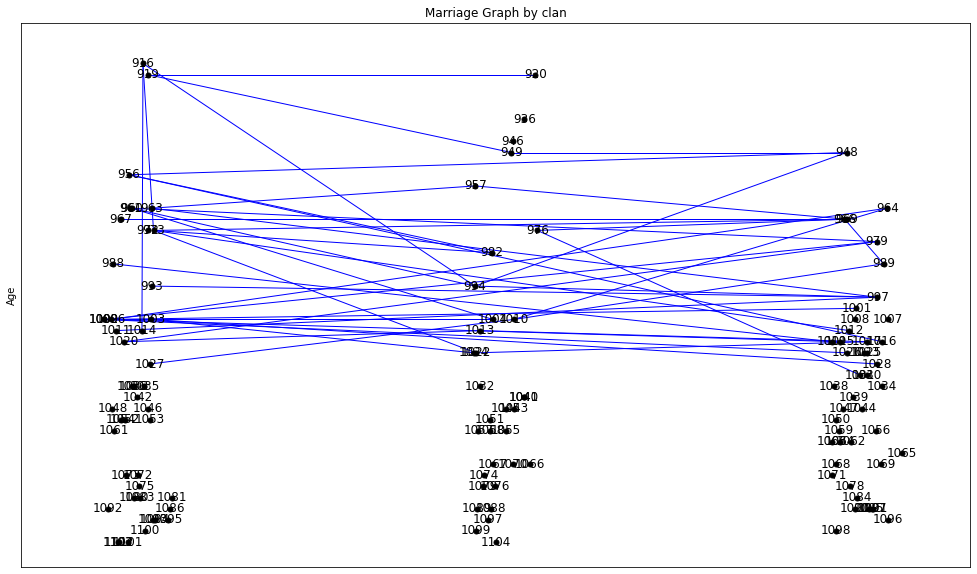

Total de enlaces: 43
Links inside the clan '1': 4.65%
Links inside the clan '3': 2.33%
Linkgs outside the clan '3' and '1': 27.91%
Linkgs outside the clan '3' and '2': 13.95%
Linkgs outside the clan '1' and '2': 11.63%
Linkgs outside the clan '2' and '1': 18.60%
Linkgs outside the clan '2' and '3': 9.30%
Linkgs outside the clan '1' and '3': 11.63%


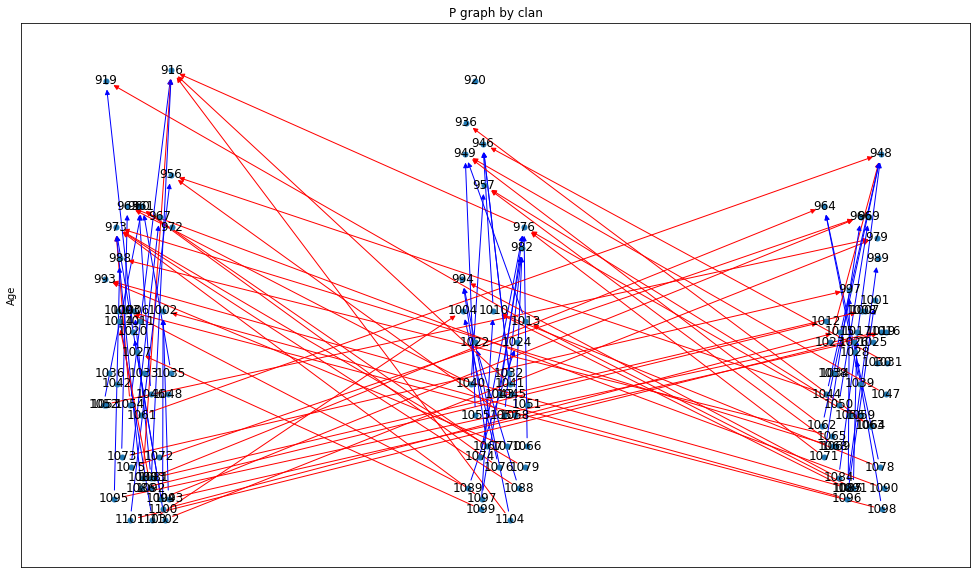

tamos en tiempo 400 con vivas 117


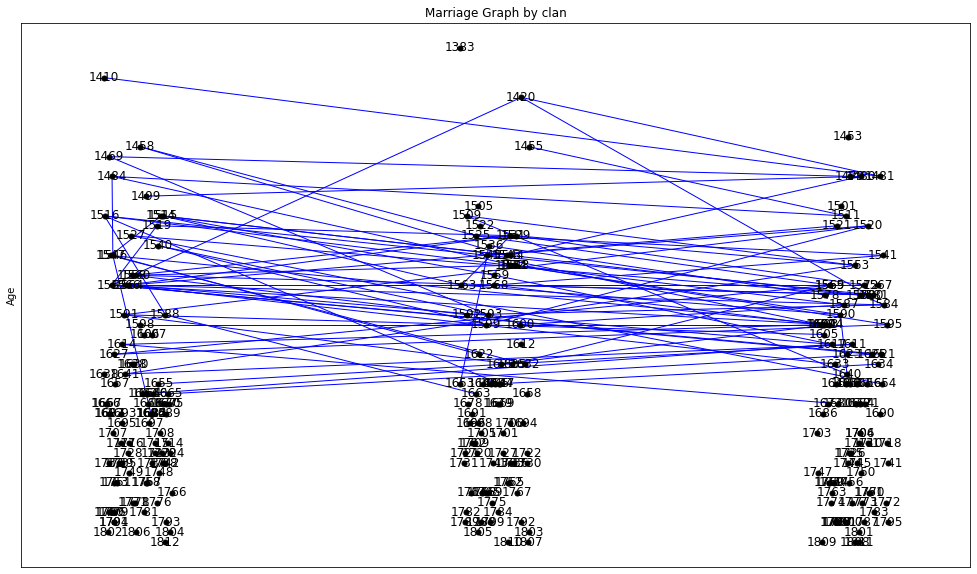

Total de enlaces: 88
Links inside the clan '3': 2.27%
Links inside the clan '1': 5.68%
Links inside the clan '2': 3.41%
Linkgs outside the clan '3' and '2': 17.05%
Linkgs outside the clan '2' and '3': 13.64%
Linkgs outside the clan '2' and '1': 10.23%
Linkgs outside the clan '1' and '3': 19.32%
Linkgs outside the clan '3' and '1': 14.77%
Linkgs outside the clan '1' and '2': 13.64%


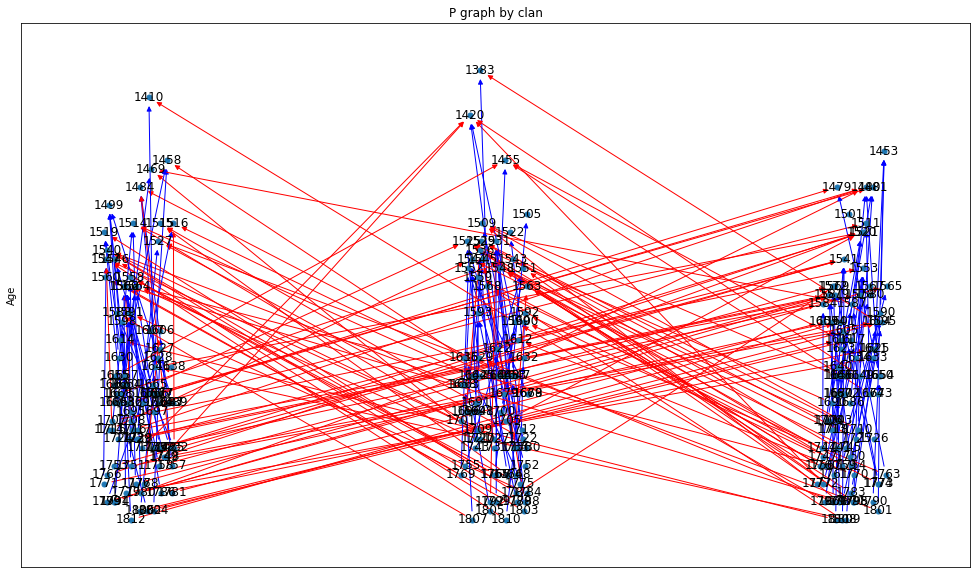

tamos en tiempo 500 con vivas 241


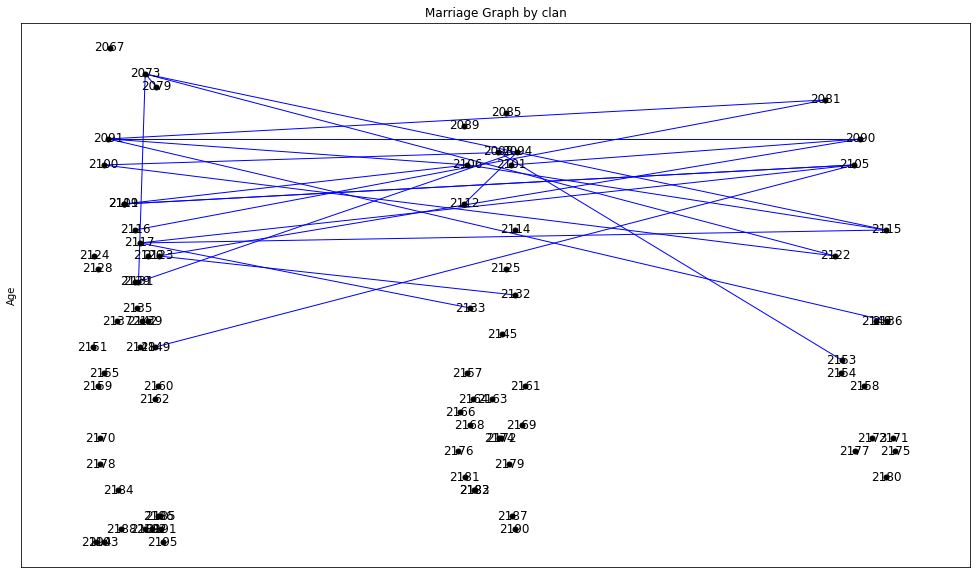

Total de enlaces: 25
Links inside the clan '2': 4.00%
Links inside the clan '1': 8.00%
Linkgs outside the clan '2' and '1': 16.00%
Linkgs outside the clan '2' and '3': 4.00%
Linkgs outside the clan '1' and '3': 24.00%
Linkgs outside the clan '3' and '2': 8.00%
Linkgs outside the clan '3' and '1': 28.00%
Linkgs outside the clan '1' and '2': 8.00%


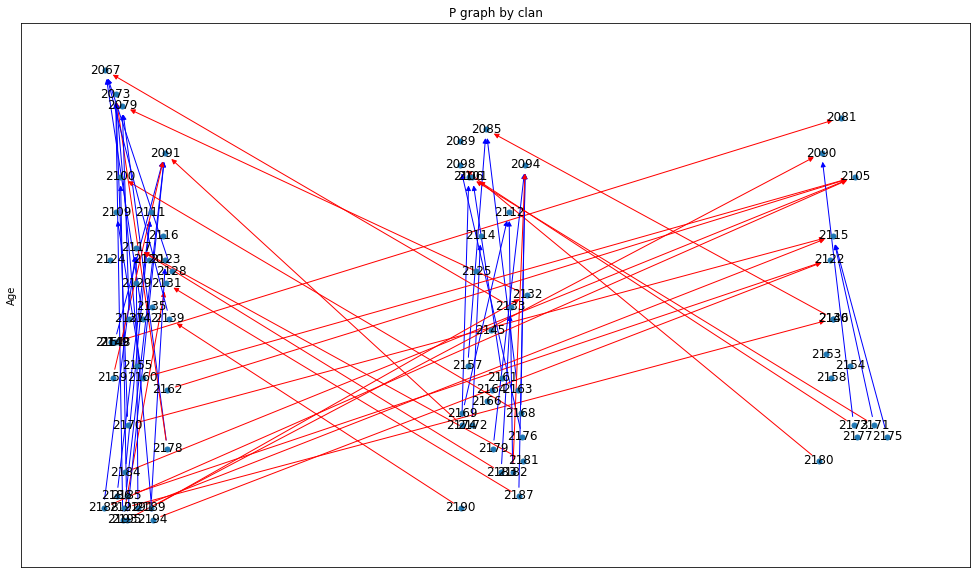

tamos en tiempo 600 con vivas 78


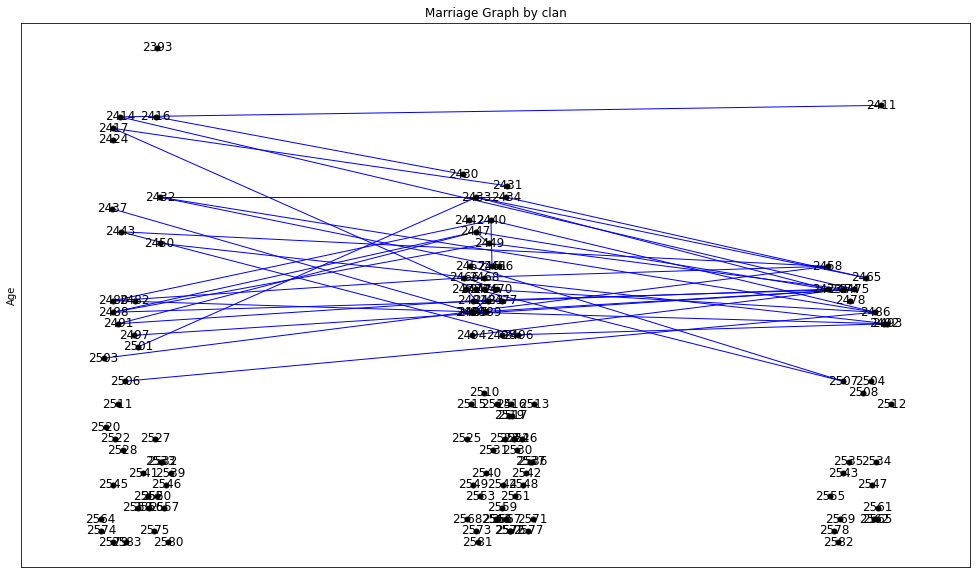

Total de enlaces: 46
Links inside the clan '2': 13.04%
Linkgs outside the clan '2' and '1': 23.91%
Linkgs outside the clan '2' and '3': 13.04%
Linkgs outside the clan '3' and '2': 21.74%
Linkgs outside the clan '1' and '2': 10.87%
Linkgs outside the clan '3' and '1': 15.22%
Linkgs outside the clan '1' and '3': 2.17%


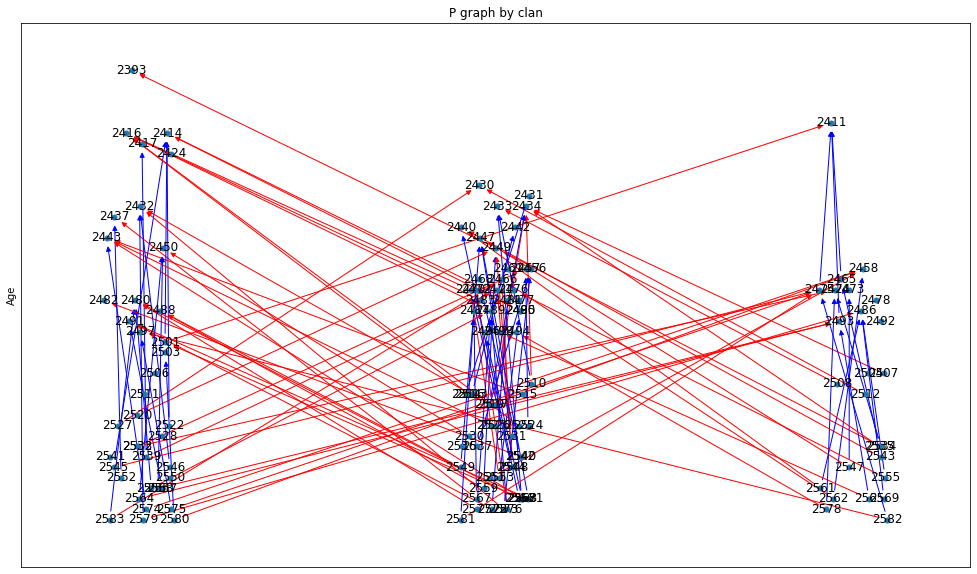

tamos en tiempo 700 con vivas 119


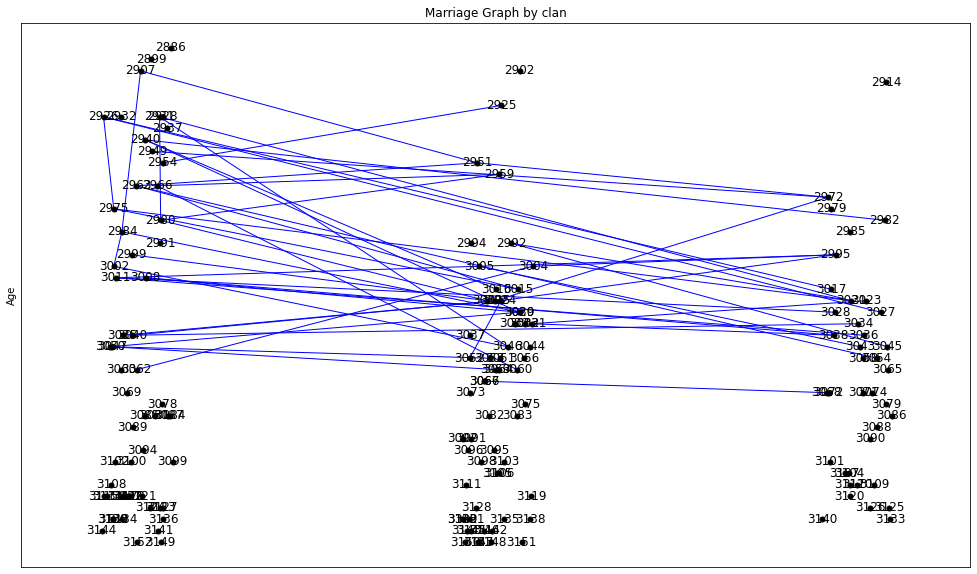

Total de enlaces: 50
Links inside the clan '1': 8.00%
Links inside the clan '2': 2.00%
Linkgs outside the clan '3' and '1': 10.00%
Linkgs outside the clan '3' and '2': 10.00%
Linkgs outside the clan '2' and '3': 12.00%
Linkgs outside the clan '2' and '1': 20.00%
Linkgs outside the clan '1' and '2': 26.00%
Linkgs outside the clan '1' and '3': 12.00%


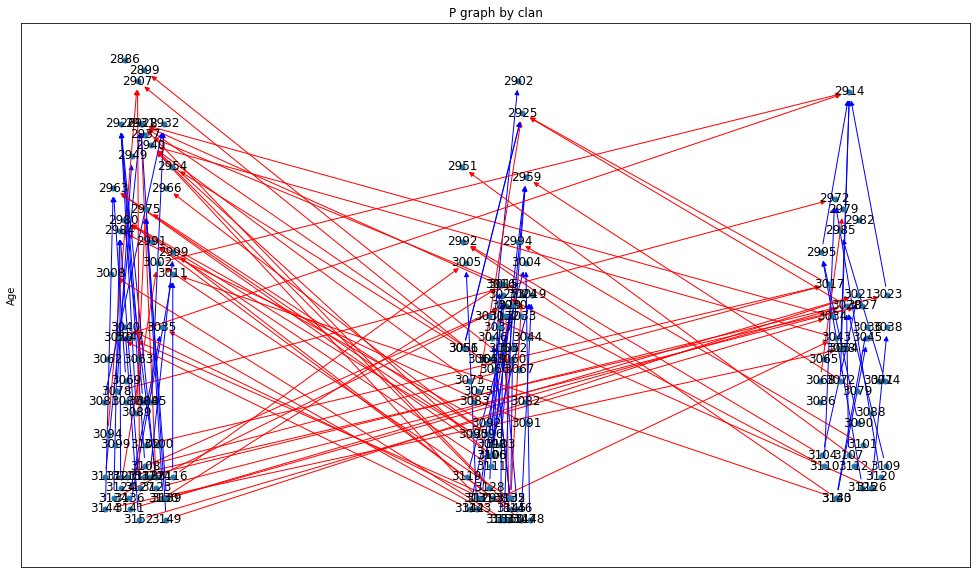

tamos en tiempo 800 con vivas 147


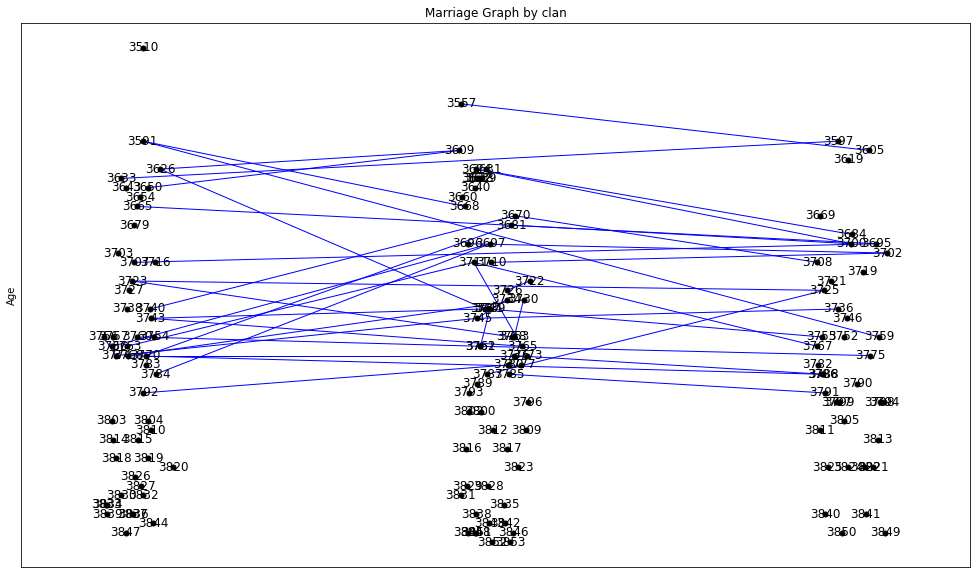

Total de enlaces: 44
Links inside the clan '2': 11.36%
Links inside the clan '1': 2.27%
Links inside the clan '3': 2.27%
Linkgs outside the clan '2' and '1': 25.00%
Linkgs outside the clan '2' and '3': 9.09%
Linkgs outside the clan '1' and '2': 13.64%
Linkgs outside the clan '3' and '2': 22.73%
Linkgs outside the clan '1' and '3': 13.64%


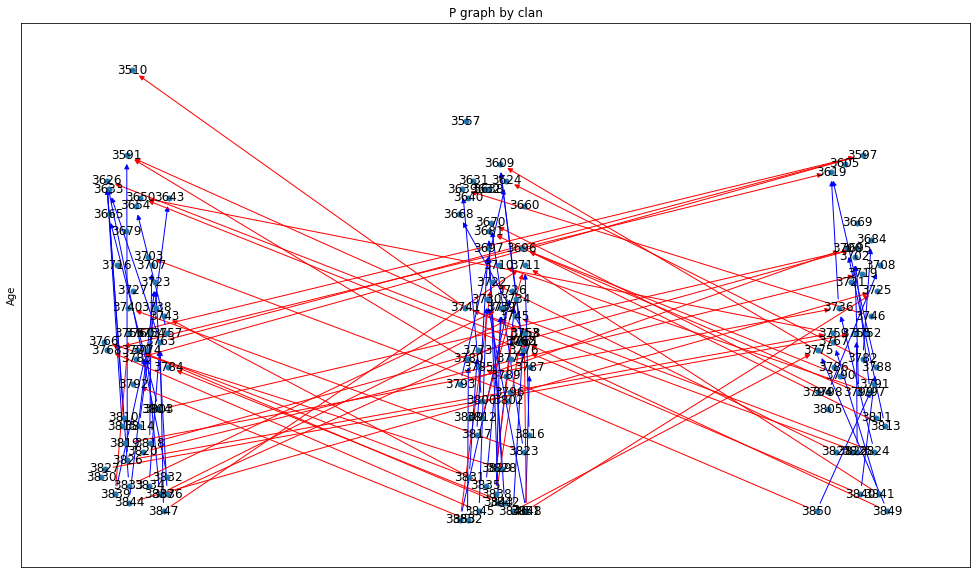

tamos en tiempo 900 con vivas 143


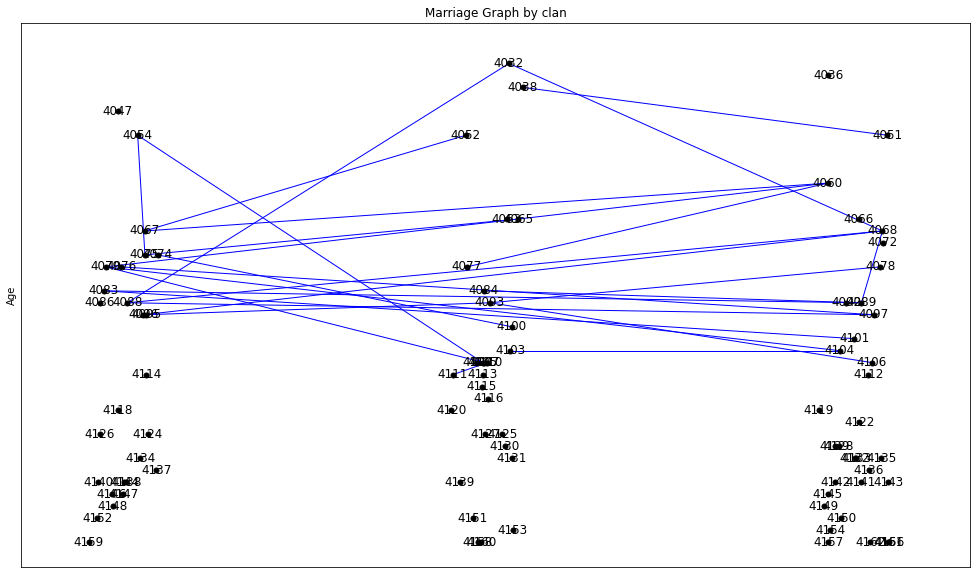

Total de enlaces: 26
Links inside the clan '3': 3.85%
Links inside the clan '1': 3.85%
Links inside the clan '2': 3.85%
Linkgs outside the clan '3' and '2': 19.23%
Linkgs outside the clan '3' and '1': 15.38%
Linkgs outside the clan '1' and '2': 15.38%
Linkgs outside the clan '2' and '3': 7.69%
Linkgs outside the clan '1' and '3': 19.23%
Linkgs outside the clan '2' and '1': 11.54%


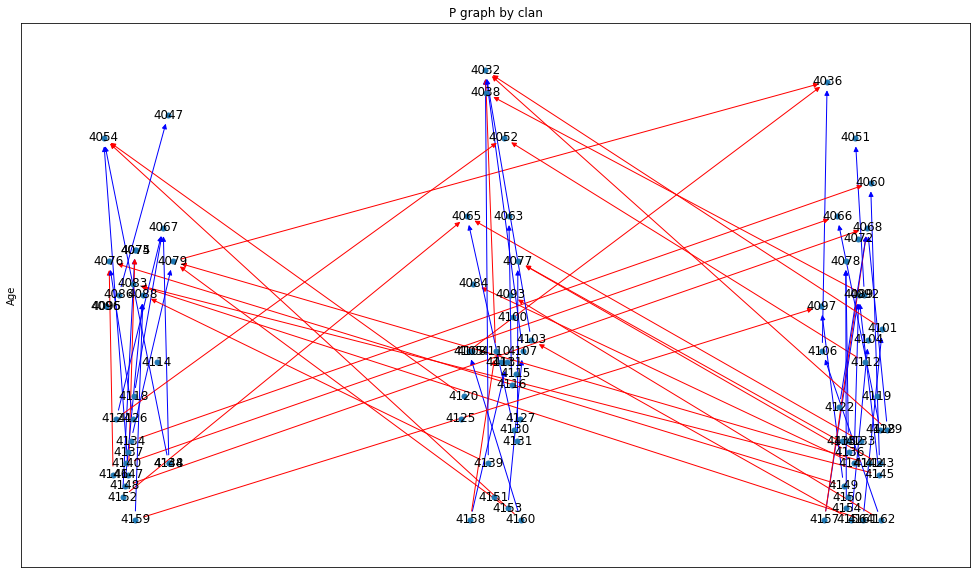

tamos en tiempo 1000 con vivas 80
84


In [6]:
#Generalized CONTROL POPULATION
#Parameters UD_generalized
iniciais = 40 # Initial UD
clanes = [1,2,3]
clans = (clanes * (iniciais // 3)) + clanes[:(iniciais % 3)]# Just 3 clans
random.shuffle(clans)
prob_morte = 0.06 # Beta from the gutertz equation
mediao = 4 # Average children per UD
random.seed(42) # Random seed
t = 1000 #steps of the simulation
dataset = [] #For the data
original_media = mediao
media = original_media
#### Initialization dual_organization
## Clans
UD_generalized_al_inh.uds = {}
instancias_ud = []
for id_ud in range(1, int(iniciais) + 1):
        instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
## Varieties
limited_varieties = True
if limited_varieties == False:
    for id_ud, ud in UD_generalized_al_inh.uds.items():
        for _ in range(3):
            ud.varieties.append(Variety())
else:
    initial_varieties = [Variety() for _ in range (10)]
    for ud in UD_generalized_al_inh.uds.values():
        for _ in range(3):
            ud.varieties.append(random.choice(initial_varieties))
#### Simulation dual_organization
vivas = [int(iniciais)]
for i in range (1, (t+1)):
    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
    # Convertir el diccionario en una lista de pares (clave, valor)
    items = list(uds_copy.items())
    random.shuffle(items)
    uds_copy = dict(items)
    alive = len(uds_copy)
    if alive > 200 and (media == original_media): #or media == original_media-1):
        media -= media//2
        if media >= 4:
            media = media //2
        #print(f' no ano {i} temos a media {media}')
    elif alive < 150 and media < original_media:
        media = original_media
        #print(f' no ano {i} temos a media {media}')
    if not uds_copy:
        print("acabo")
        break
    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
    for id_ud, ud in uds_copy.items():
        ud.ter_filho()
        ud.buscar_ud(uds_copy, media, varieties_list, True, 3, 0.2)
        ud.incrementar_idade()
        ud.death_probability(prob_morte)
    if i % 100 == 0:
        #create_vis_geral(uds_copy, True)
        Gcl = marriage_graph_attribute(uds_copy, "clan", False)
        # clan
        results_clan = count_links_between_and_within(Gcl, "clan")
        p_graph_attribute(uds_copy, "clan", False)
        # Get the dyacronic data
        #dataset = general_charactersitics_data(i, uds_copy, dataset, False, True)
        print(f"tamos en tiempo {i} con vivas {viv}")

    # Collecting data for populational dynamics
    viv = len([ud for id, ud in uds_copy.items() if ud.activa])
    vivas.append(viv)
        
print(len([ud for id, ud in uds_copy.items() if ud.activa]))
#final = general_charactersitics_data(None, None, dataset, final = True, clan = True)